# Dataset context
This dataset covers the period from December 2019 to
December 2023. It focuses on how students manage their
screen time, especially during exam sessions. Each year has
two sessions: the first runs from December 15 to March 15,
the second from June 15 to August 15.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from my_utils import *

import warnings

warnings.filterwarnings("ignore")

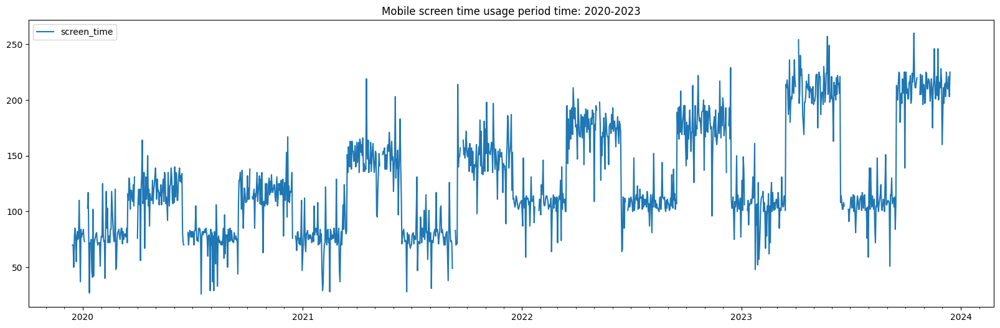

In [2]:
df = pd.read_csv("mobile_usage_dataset_2020_2023.csv")
df['data'] = pd.to_datetime(df['data']) 
df.set_index('data', inplace=True)
plot(df, title="Mobile screen time usage period time: 2020-2023")

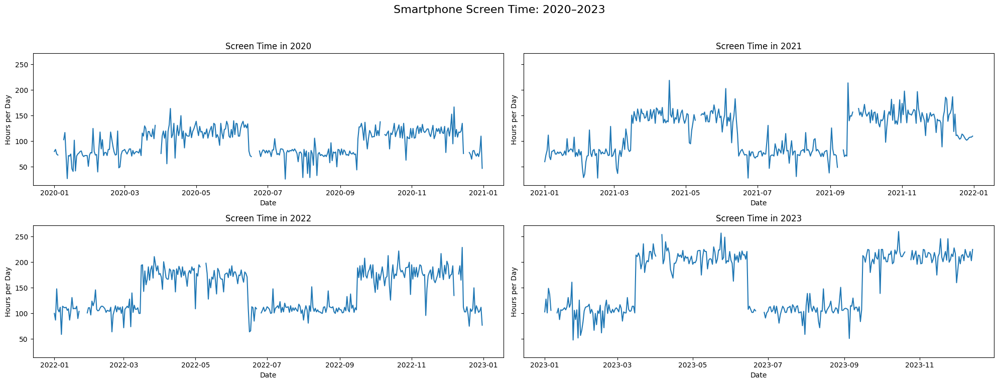

In [3]:
# More details

fig, axes = plt.subplots(2, 2, figsize=(20, 8), sharey=True)
axes = axes.flatten()

for ax, year in zip(axes, [2020, 2021, 2022, 2023]):
    yearly = df[df.index.year == year]
    ax.plot(yearly.index, yearly['screen_time'])
    ax.set_title(f"Screen Time in {year}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Hours per Day")

fig.suptitle("Smartphone Screen Time: 2020–2023", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [4]:
df['screen_time'] = df['screen_time'].interpolate(method='time')

# Separate Training, Validation and Forecast

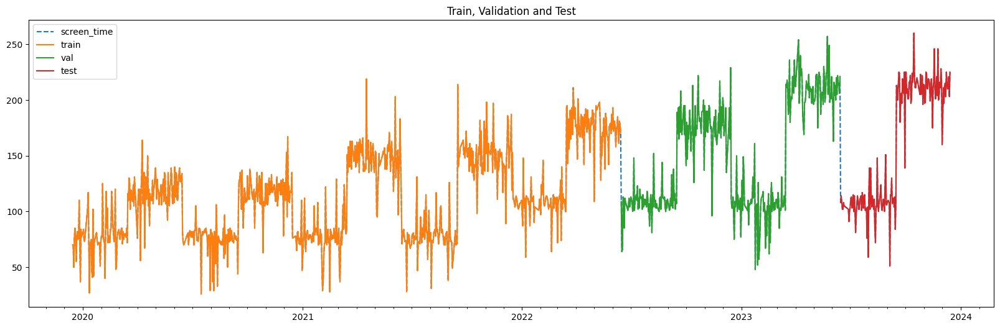

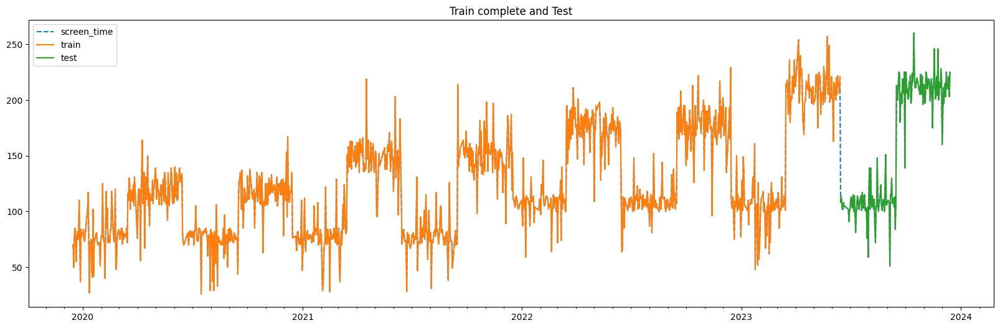

In [5]:
train = df.loc[:'2022-06-14'].copy()
val   = df.loc['2022-06-15':'2023-06-14'].copy()
train_complete = pd.concat([train, val])
test  = df.loc['2023-06-15':].copy()

multiple_plot([
    {'df': df, 'column': 'screen_time', 'label': 'screen_time', 'style': '--'},
    {'df': train, 'column': 'screen_time', 'label': 'train', 'style': '-'},
    {'df': val, 'column': 'screen_time', 'label': 'val', 'style': '-'},
    {'df': test, 'column': 'screen_time', 'label': 'test', 'style': '-'}
], title= "Train, Validation and Test")

multiple_plot([
    {'df': df, 'column': 'screen_time', 'label': 'screen_time', 'style': '--'},
    {'df': train_complete, 'column': 'screen_time', 'label': 'train', 'style': '-'},
    {'df': test, 'column': 'screen_time', 'label': 'test', 'style': '-'}
], title= "Train complete and Test")


# Clean the Train Set

In [6]:
from pykalman import KalmanFilter

def outlier_detection(data, mul=1.5,debug = False):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - mul * IQR
    upper_limit = Q3 + mul * IQR
    n_low  = (data < lower_limit).sum()
    n_high = (data > upper_limit).sum()

    if debug:
        print(f"Lower bound: {lower_limit:.2f}, Upper bound: {upper_limit:.2f}")
        print(f"Points below lower: {n_low}, points above upper: {n_high}")

    outlier_mask = (data < lower_limit) | (data > upper_limit)
    return  data[~outlier_mask]

def kalman_filter(series):
    kf = KalmanFilter(transition_matrices=[1],
                      observation_matrices=[1],
                      initial_state_mean=series[0],
                      n_dim_state=1)
        
    kf_fitted = kf.em(series.values)
    state_means, _ = kf_fitted.smooth(series.values)
    return state_means.flatten()

## Remove the outliers

Lower bound: 54.00, Upper bound: 102.00
Points below lower: 10, points above upper: 9
Lower bound: 81.00, Upper bound: 157.00
Points below lower: 3, points above upper: 1
Lower bound: 59.50, Upper bound: 95.50
Points below lower: 9, points above upper: 3
Lower bound: 85.00, Upper bound: 149.00
Points below lower: 2, points above upper: 2
Lower bound: 57.00, Upper bound: 97.00
Points below lower: 7, points above upper: 9
Lower bound: 114.75, Upper bound: 180.75
Points below lower: 4, points above upper: 3
Lower bound: 54.50, Upper bound: 98.50
Points below lower: 5, points above upper: 9
Lower bound: 111.22, Upper bound: 188.63
Points below lower: 3, points above upper: 3
Lower bound: 89.68, Upper bound: 125.39
Points below lower: 6, points above upper: 6
Lower bound: 143.25, Upper bound: 213.25
Points below lower: 6, points above upper: 0


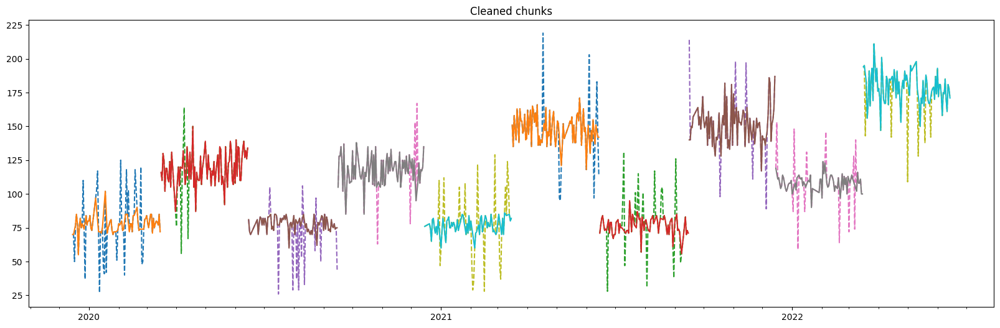

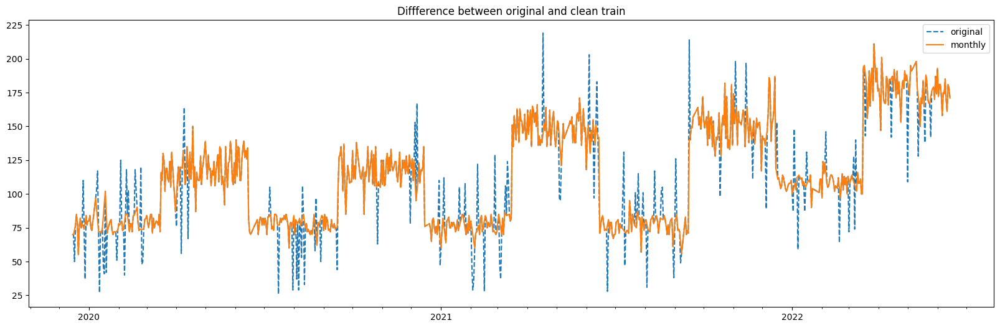

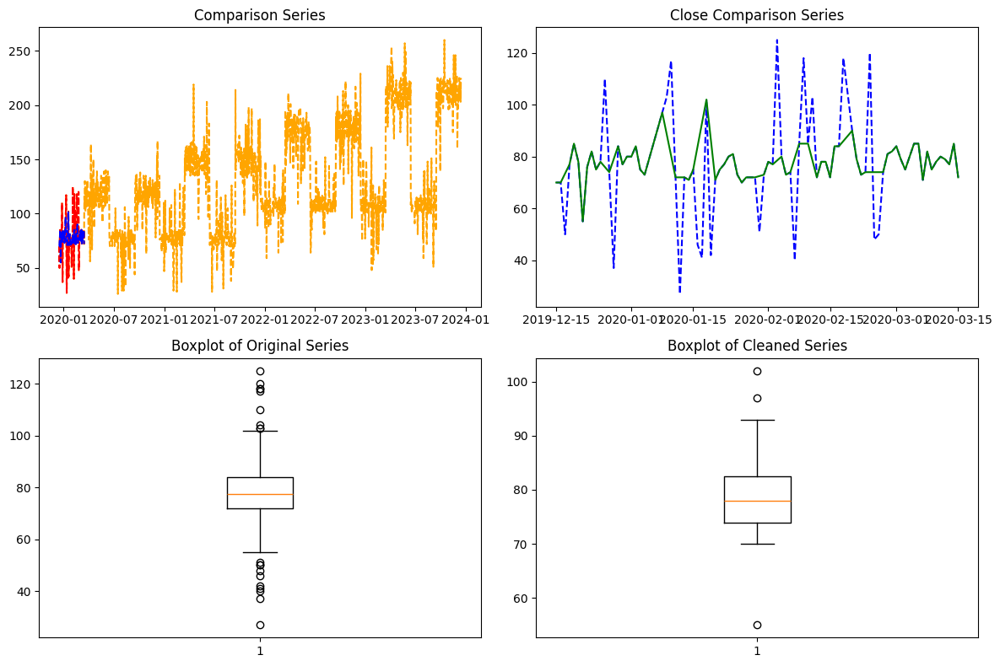

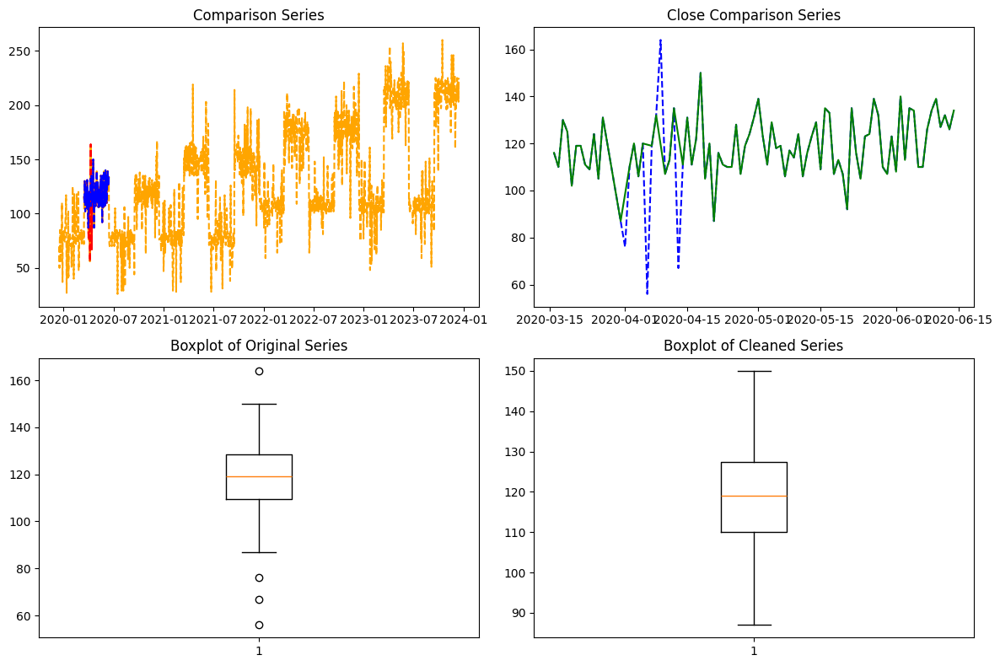

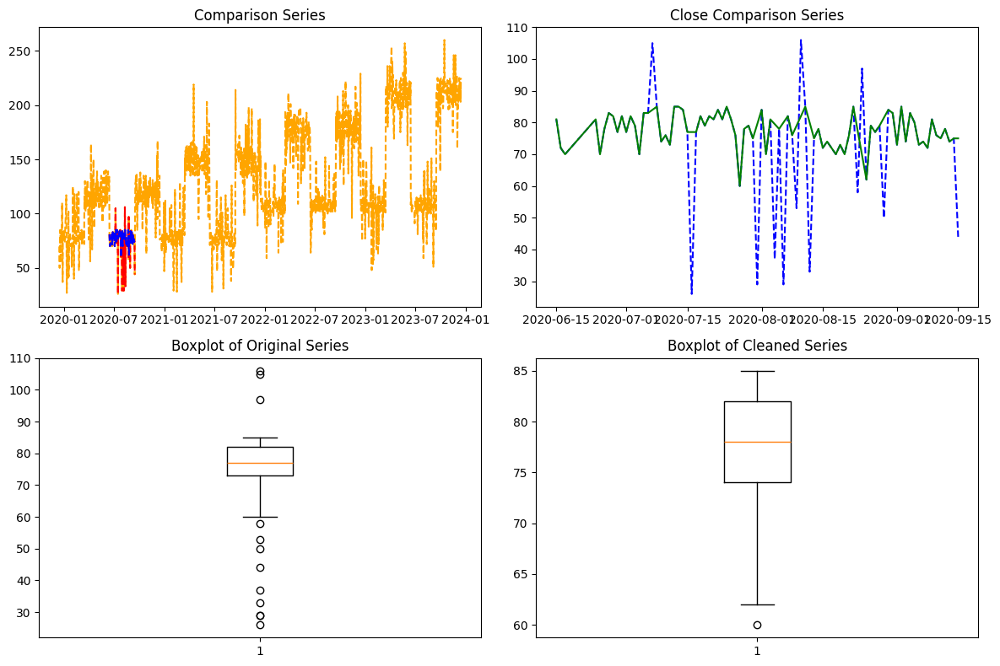

...

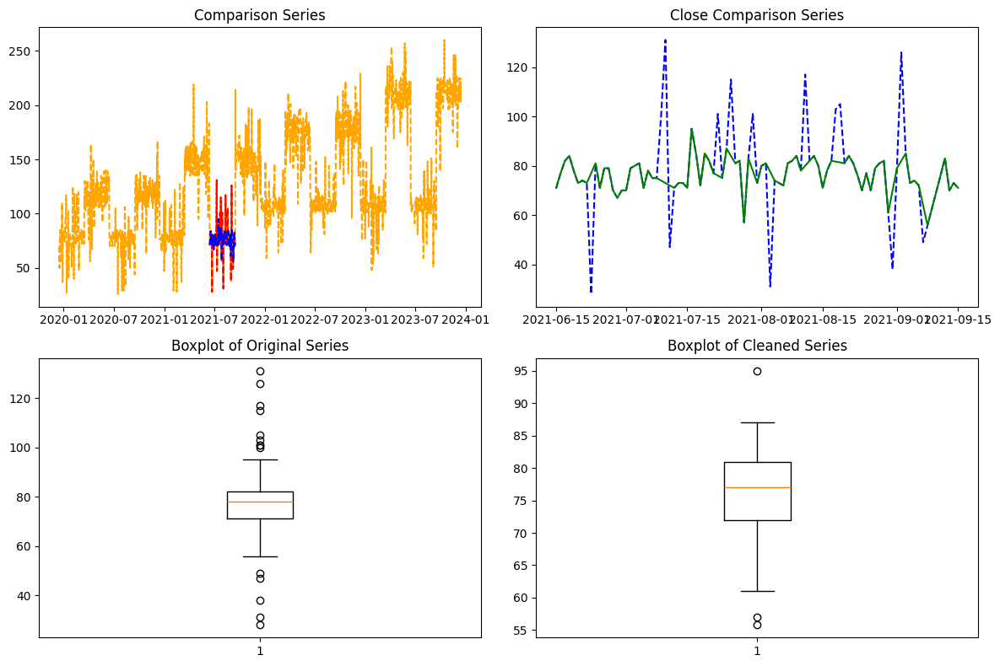

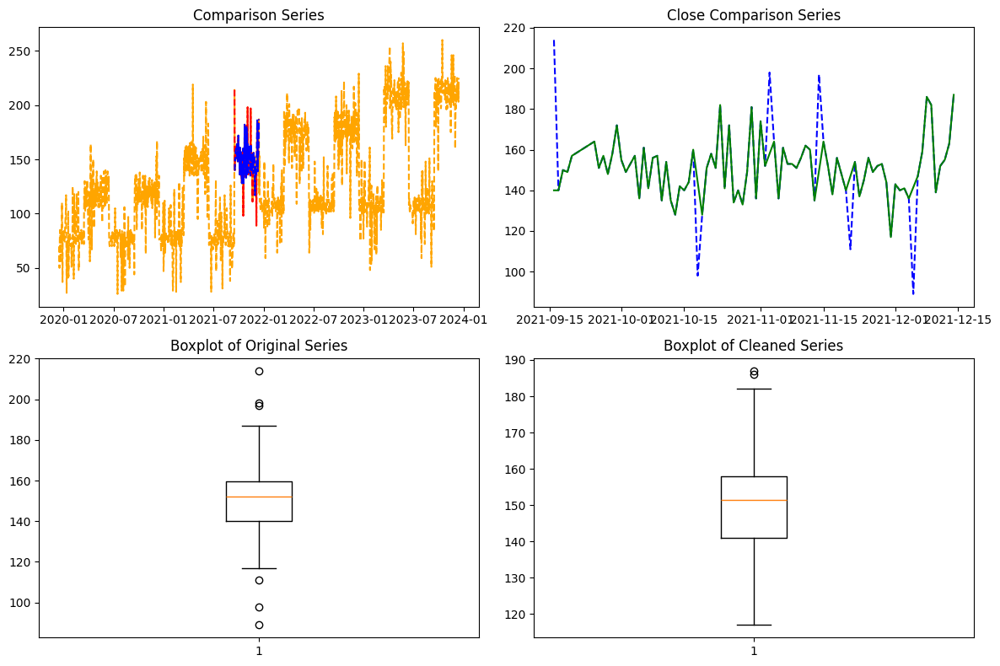

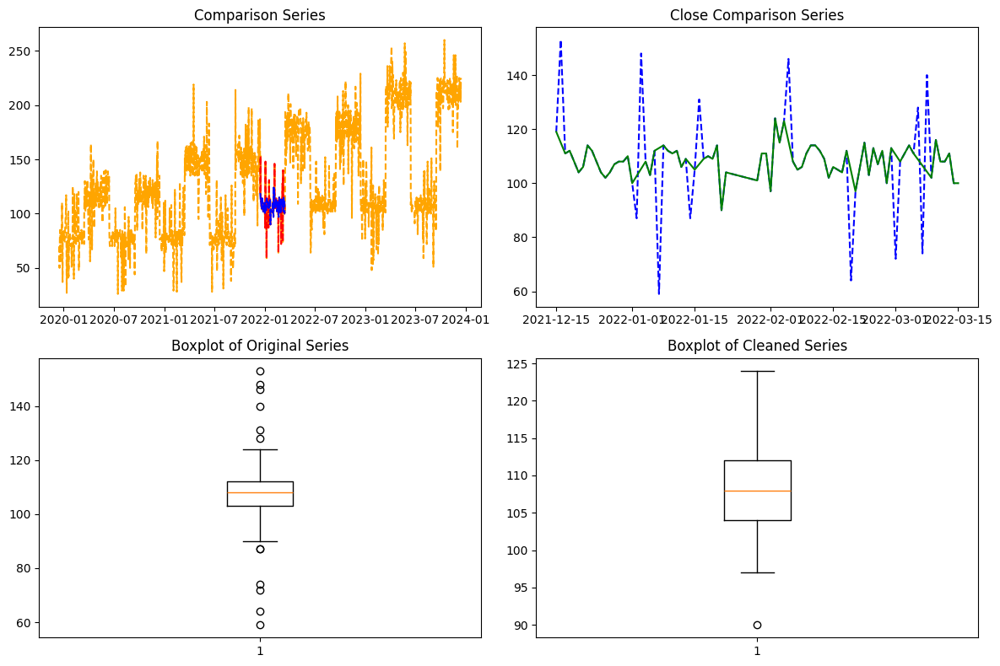

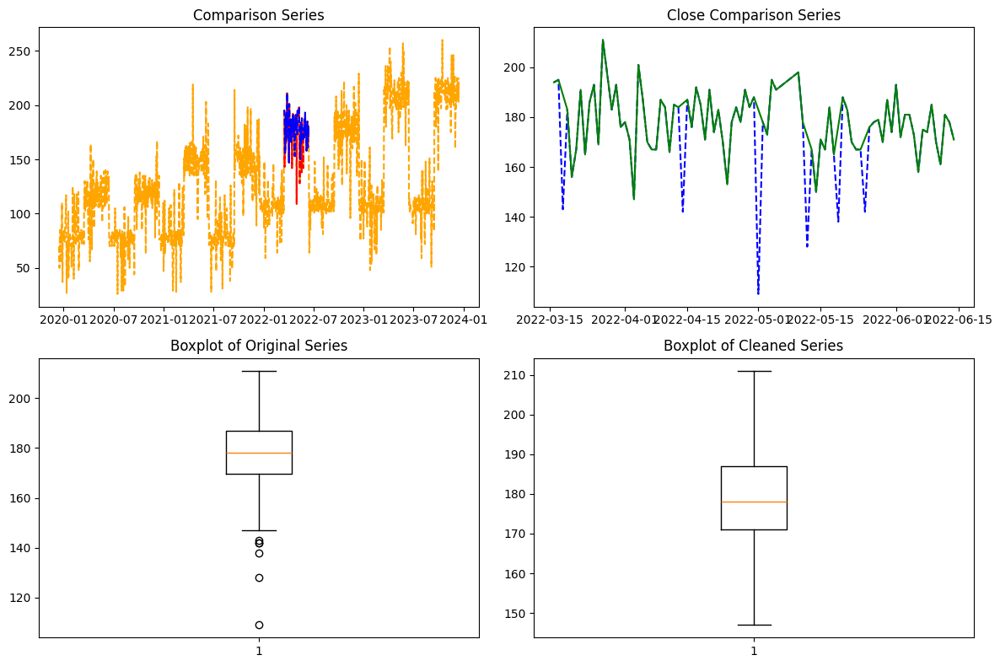

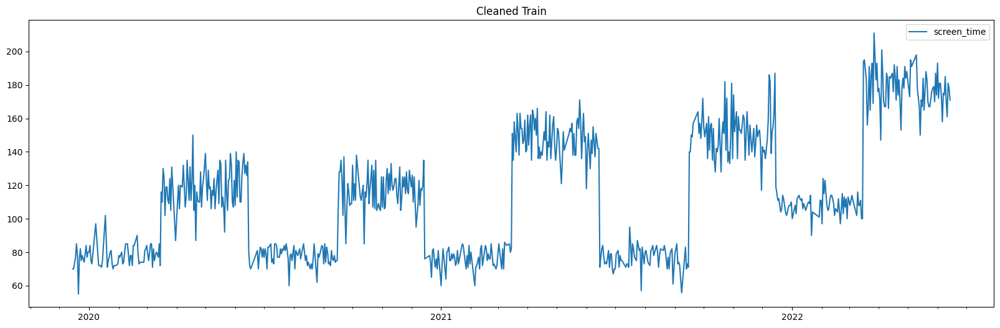

In [7]:
# divide base on exam period
change_points = train['exam_period'] != train['exam_period'].shift()
group_ids = change_points.cumsum() 
chunks = [group for _, group in train.groupby(group_ids)]

for i, chunk in enumerate(chunks):
    chunk['clean'] = outlier_detection(chunk['screen_time'], mul=1.5, debug=True)
    chunk['clean'] = chunk['clean'].interpolate(method='time')
    chunk['clean'] = chunk['clean'].fillna(method='bfill').fillna(method='ffill')

plt.figure(figsize=(20, 6))
for i, chunk in enumerate(chunks):
    plt.plot(chunk['screen_time'], linestyle='--')
    plt.plot(chunk['clean'])
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
plt.title("Cleaned chunks")
plt.show(block=True)

train_screen_time_clean = pd.concat(chunks).sort_index()

multiple_plot([
    {'df': train, 'column': 'screen_time', 'label': 'original', 'style': '--'},
    {'df': train_screen_time_clean, 'column': 'clean', 'label': 'monthly', 'style': '-'},
], title="Diffference between original and clean train")

# show the results
for i, chunk in enumerate(chunks):
    series = chunk.screen_time
    series_clean = chunk.clean
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))

    axs[0, 0].plot(df.screen_time, color='orange', linestyle='--')    
    axs[0, 0].plot(series, color='red', linestyle='--') 
    axs[0, 0].plot(series_clean, color='blue', linestyle='--')
    axs[0, 0].set_title('Comparison Series')

    axs[0, 1].plot(series, color='blue', linestyle='--')
    axs[0, 1].plot(series_clean, color='green')
    axs[0, 1].set_title('Close Comparison Series')

    # Boxplot of original series
    axs[1, 0].boxplot(series.dropna(), vert=True)
    axs[1, 0].set_title('Boxplot of Original Series')

    # Boxplot of cleaned series
    axs[1, 1].boxplot(series_clean.dropna(), vert=True)
    axs[1, 1].set_title('Boxplot of Cleaned Series')

    plt.tight_layout()
    plt.show()

train_clean = train.copy()
train_clean.screen_time = train_screen_time_clean['clean']
plot(train_clean, title="Cleaned Train")

## Apply the kalman filter for smothing

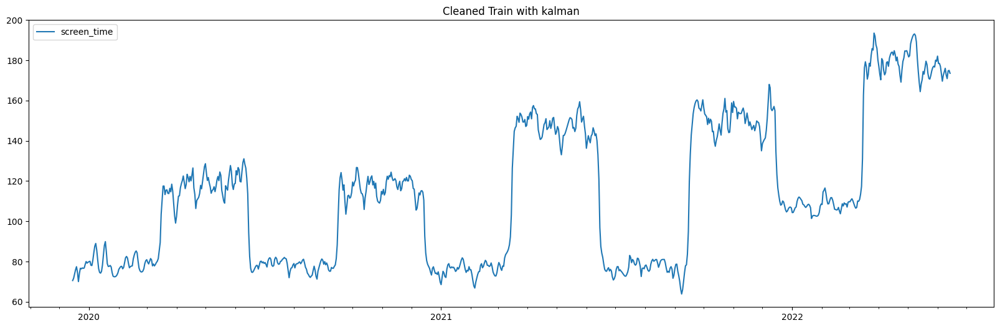

In [8]:
train_clean['screen_time'] = kalman_filter(train_clean.screen_time)
plot(train_clean, title="Cleaned Train with kalman")

# Trend and Seasonality analysis

In [9]:
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import boxcox
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf

def adf_test(series):
    adf_result = adfuller(series)

    print(f"ADF Statistic: {adf_result[0]}")
    print(f"p-value: {adf_result[1]}")
    
    for key, value in adf_result[4].items():
        print(f"{key}:{value}")
    
    if adf_result[1] <= 0.05:
        print("The series is stationary") # Reject the null hypothesis
    else:
        print("The series is non-stationary") # Fail to reject the null hypothesis

def difference(data, interval):
    return [data[i] - data[i-interval] for i in range(interval, len(data))]


def ACF_plot(df, column="screen_time", lags=40, figsize=(20, 12)):
    series = df[column]

    fig, axs = plt.subplots(2, 2, figsize=figsize)

    # --- Plot 1: Raw time series ---
    axs[0, 0].plot(df[column], label=column)
    axs[0, 0].xaxis.set_major_locator(mdates.YearLocator())
    axs[0, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    axs[0, 0].xaxis.set_minor_locator(mdates.MonthLocator())
    axs[0, 0].legend()
    axs[0, 0].set_title('Raw Time Series')

    # --- Plot 2: ACF of original series ---
    plot_acf(series, lags=lags, ax=axs[0, 1])
    axs[0, 1].set_title('ACF of Original Series')
    axs[0, 1].set_xticks(range(0, lags))

    # --- Plot 3: Differenced series ---
    df_bc, lam = boxcox(df[column])
    diff1_df= difference(df_bc, 1)
    
    diff_series = pd.Series(diff1_df).dropna()
    axs[1, 0].plot(diff_series, color='orange')
    axs[1, 0].xaxis.set_major_locator(mdates.YearLocator())
    axs[1, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    axs[1, 0].xaxis.set_minor_locator(mdates.MonthLocator())
    axs[1, 0].set_title('Differenced Series')

    # --- Plot 4: ACF of differenced series ---
    plot_acf(diff_series, lags=lags-1, ax=axs[1, 1])
    axs[1, 1].set_title('ACF of Differenced Series')
    axs[1, 1].set_xticks(range(0, lags-1))

    plt.tight_layout()
    plt.show()

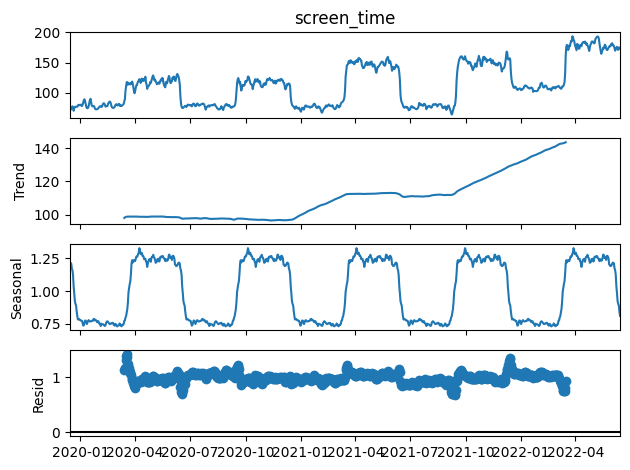

ADF Statistic: -2.452773421277758
p-value: 0.1273918263425428
1%:-3.4376043869287467
5%:-2.8647424697167403
10%:-2.5684752071912444
The series is non-stationary
ADF Statistic: -9.848864755339928
p-value: 4.541974794924574e-17
1%:-3.4376043869287467
5%:-2.8647424697167403
10%:-2.5684752071912444
The series is stationary


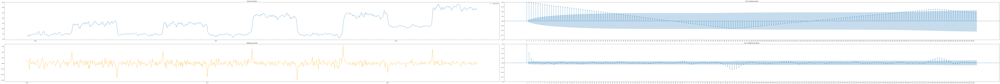

In [10]:
result = seasonal_decompose(train_clean.screen_time, model='multiplicative',period=180)
result.plot()
plt.show()

adf_test(train_clean.screen_time) # p-value: 0.1273918263425428

train_clean_diff1 = difference(train_clean.screen_time, 1)
adf_test(train_clean_diff1) # p-value: 4.541974794924574e-17

d=1

ACF_plot(train_clean, lags = 200, figsize=(140, 12))

#  Resample

In [11]:
def monthly_resample(data):
    return data.resample('ME').mean()

def weekly_resample(data):
    return data.resample('W').mean()

def plot_splits_len(train, val, test, time_period):
    lengths = {
        'Train': len(train),
        'Validation': len(val),
        'Test': len(test)
    }

    plt.figure(figsize=(8, 5))
    plt.bar(lengths.keys(), lengths.values(), color=['blue', 'green', 'red'])

    # Add value labels
    for i, (k, v) in enumerate(lengths.items()):
        plt.text(i, v + 0.5, str(v), ha='center', va='bottom')

    plt.title(f"Lengths of Data Splits (in {time_period})")
    plt.ylabel(f"Number of {time_period}")
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def clean(data):
    series = data.copy()
    change_points = series['exam_period'] != series['exam_period'].shift()
    group_ids = change_points.cumsum() 
    chunks = [group for _, group in series.groupby(group_ids)]

    for i, chunk in enumerate(chunks):
        chunk['clean'] = outlier_detection(chunk['screen_time'])
        chunk['clean'] = chunk['clean'].interpolate(method='time')
        chunk['clean'] = chunk['clean'].fillna(method='bfill').fillna(method='ffill')

    screen_time_clean = pd.concat(chunks).sort_index()
    series.screen_time= screen_time_clean['clean']

    series.screen_time = kalman_filter(series.screen_time)

    return series

## Monthly

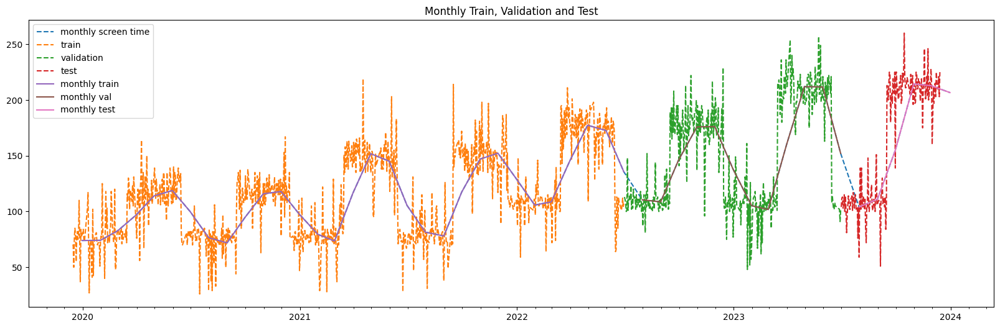

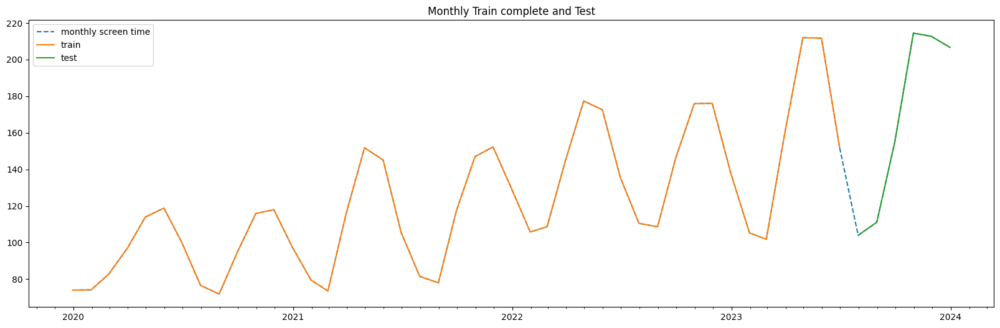

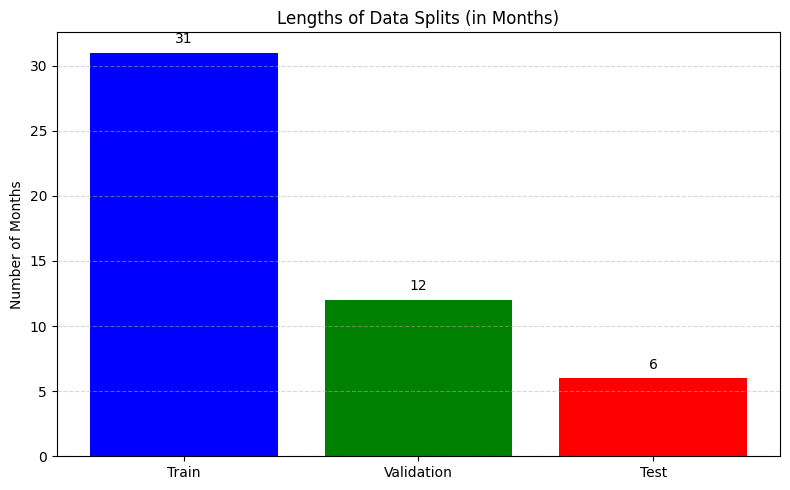

In [12]:

df_monthly = monthly_resample(df)

train_monthly = df_monthly.loc[:'2022-06'].copy()
val_monthly   = df_monthly.loc['2022-07':'2023-06'].copy()
train_complete_monthly = pd.concat([train_monthly, val_monthly])
test_monthly  = df_monthly.loc['2023-07':].copy()

multiple_plot([
    {'df': df_monthly, 'column': 'screen_time', 'label': 'monthly screen time', 'style': '--'},
    {'df': df[:'2022-06'], 'column': 'screen_time', 'label': 'train', 'style': '--'},
    {'df': df['2022-07':'2023-06'], 'column': 'screen_time', 'label': 'validation', 'style': '--'},
    {'df': df['2023-07':], 'column': 'screen_time', 'label': 'test', 'style': '--'},
    {'df': train_monthly, 'column': 'screen_time', 'label': 'monthly train', 'style': '-'},
    {'df': val_monthly, 'column': 'screen_time', 'label': 'monthly val', 'style': '-'},
    {'df': test_monthly, 'column': 'screen_time', 'label': 'monthly test', 'style': '-'}
], title="Monthly Train, Validation and Test")

multiple_plot([
    {'df': df_monthly, 'column': 'screen_time', 'label': 'monthly screen time', 'style': '--'},
    {'df': train_complete_monthly, 'column': 'screen_time', 'label': 'train', 'style': '-'},
    {'df': test_monthly, 'column': 'screen_time', 'label': 'test', 'style': '-'}
], title="Monthly Train complete and Test")


plot_splits_len(train_monthly, val_monthly,  test_monthly, "Months")

## WEEKLY

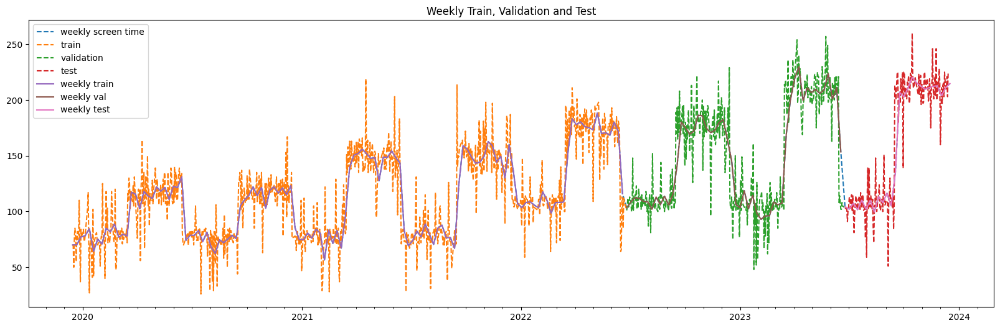

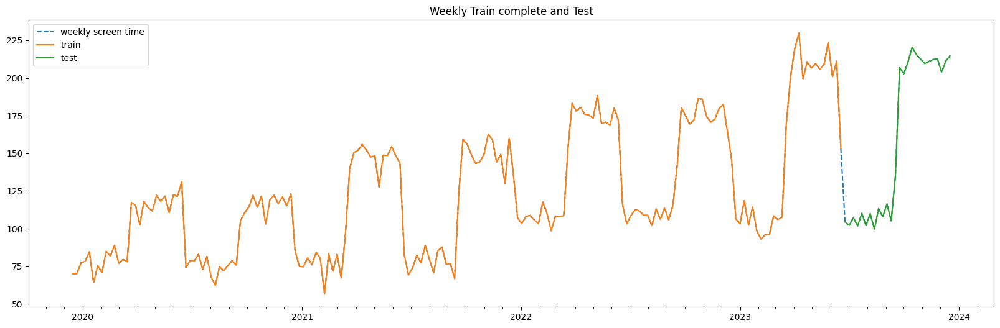

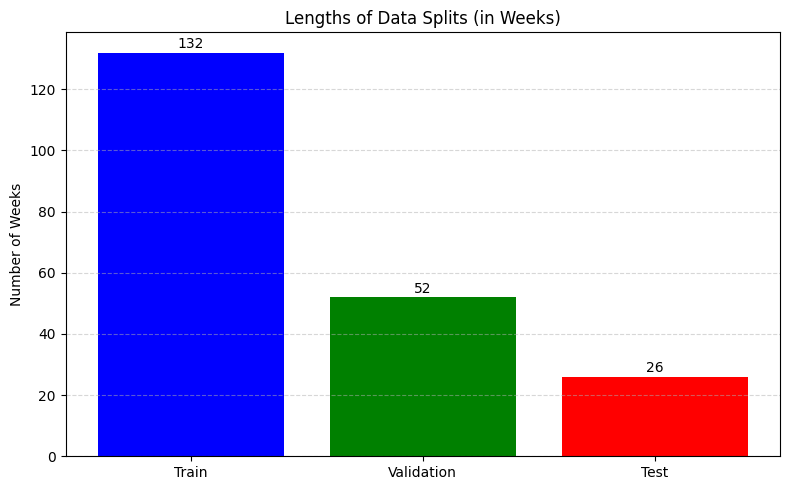

In [13]:
df_weekly= weekly_resample(df)

train_weekly = df_weekly.loc[:'2022-06-25'].copy()
val_weekly   = df_weekly.loc['2022-06-26':'2023-06-24'].copy()
train_complete_weekly = pd.concat([train_weekly, val_weekly])
test_weekly  = df_weekly.loc['2023-06-25':].copy()


multiple_plot([
    {'df': df_weekly, 'column': 'screen_time', 'label': 'weekly screen time', 'style': '--'},
    {'df': df[:'2022-06-25'], 'column': 'screen_time', 'label': 'train', 'style': '--'},
    {'df': df['2022-06-26':'2023-06-24'], 'column': 'screen_time', 'label': 'validation', 'style': '--'},
    {'df': df['2023-06-25':], 'column': 'screen_time', 'label': 'test', 'style': '--'},
    {'df': train_weekly, 'column': 'screen_time', 'label': 'weekly train', 'style': '-'},
    {'df': val_weekly, 'column': 'screen_time', 'label': 'weekly val', 'style': '-'},
    {'df': test_weekly, 'column': 'screen_time', 'label': 'weekly test', 'style': '-'}
], title="Weekly Train, Validation and Test")

multiple_plot([
    {'df': df_weekly, 'column': 'screen_time', 'label': 'weekly screen time', 'style': '--'},
    {'df': train_complete_weekly, 'column': 'screen_time', 'label': 'train', 'style': '-'},
    {'df': test_weekly, 'column': 'screen_time', 'label': 'test', 'style': '-'}
], title="Weekly Train complete and Test")

plot_splits_len(train_weekly, val_weekly,  test_weekly, "Weeks")

## Cleaning

### Monthly

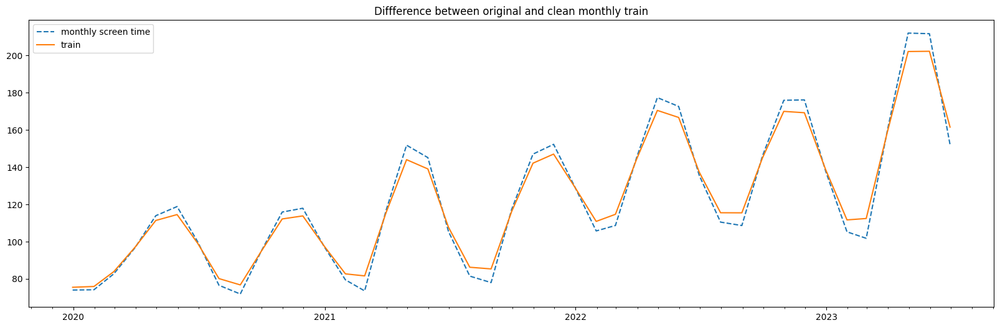

In [14]:
train_monthly_clean = clean(train_monthly)
train_complete_monthly_clean = clean(train_complete_monthly)

multiple_plot([
    {'df': train_complete_monthly, 'column': 'screen_time', 'label': 'monthly screen time', 'style': '--'},
    {'df': train_complete_monthly_clean, 'column': 'screen_time', 'label': 'train', 'style': '-'}
], title="Diffference between original and clean monthly train")

### weekly

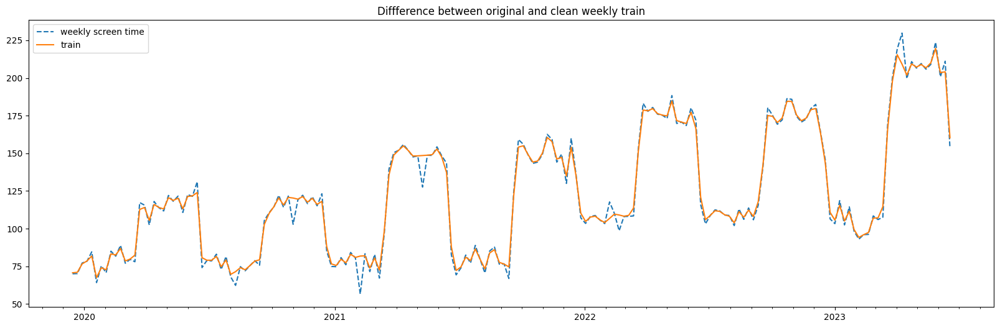

In [15]:
train_weekly_clean = clean(train_weekly)
train_complete_weekly_clean = clean(train_complete_weekly)

multiple_plot([
    {'df': train_complete_weekly, 'column': 'screen_time', 'label': 'weekly screen time', 'style': '--'},
    {'df': train_complete_weekly_clean, 'column': 'screen_time', 'label': 'train', 'style': '-'}
], title="Diffference between original and clean weekly train")

## TREND AND SEASONALITY

In [16]:
print("Monthly")
adf_test(train_monthly_clean.screen_time) #p-value: 0.9977032225199828
print("Weekly")
adf_test(train_weekly_clean.screen_time) # p-value: 0.3902360413986832

Monthly
ADF Statistic: 1.5511075333426576
p-value: 0.9977032225199828
1%:-3.7883858816542486
5%:-3.013097747543462
10%:-2.6463967573696143
The series is non-stationary
Weekly
ADF Statistic: -1.7803980100026364
p-value: 0.3902360413986832
1%:-3.4870216863700767
5%:-2.8863625166643136
10%:-2.580009026141913
The series is non-stationary


In [17]:
print("Monthly diff 1")
adf_test(pd.Series(difference(train_monthly_clean.screen_time, 1)))
print("Weekly diff 2")
adf_test(pd.Series(difference(train_weekly_clean.screen_time, 1)))

Monthly diff 1
ADF Statistic: -7.339662435180074
p-value: 1.0734592163881212e-10
1%:-3.6996079738860943
5%:-2.9764303469999494
10%:-2.627601001371742
The series is stationary
Weekly diff 2
ADF Statistic: -8.920328061683382
p-value: 1.0453255074458747e-14
1%:-3.487517288664615
5%:-2.8865777180380032
10%:-2.5801239192052012
The series is stationary


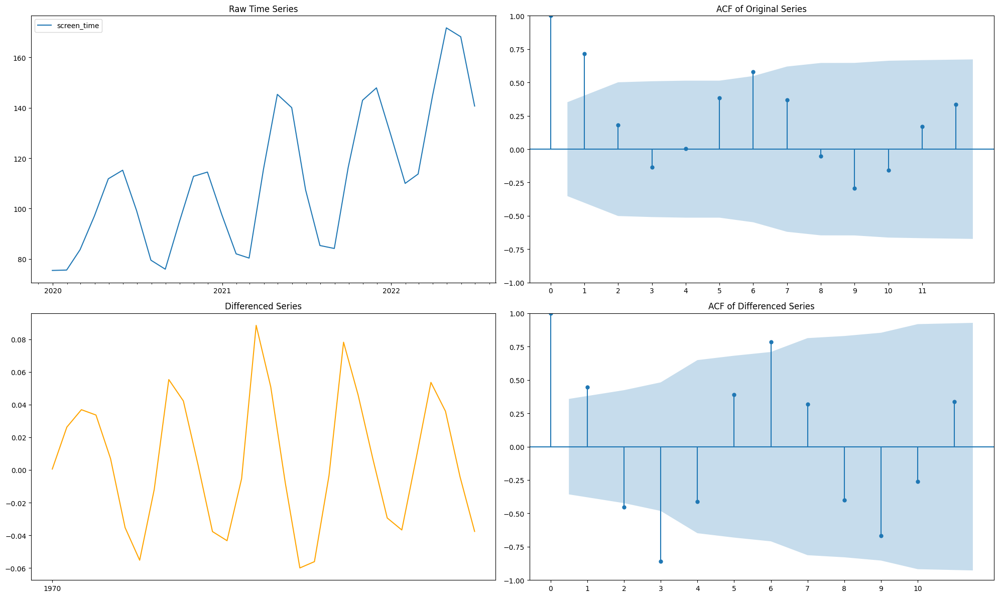

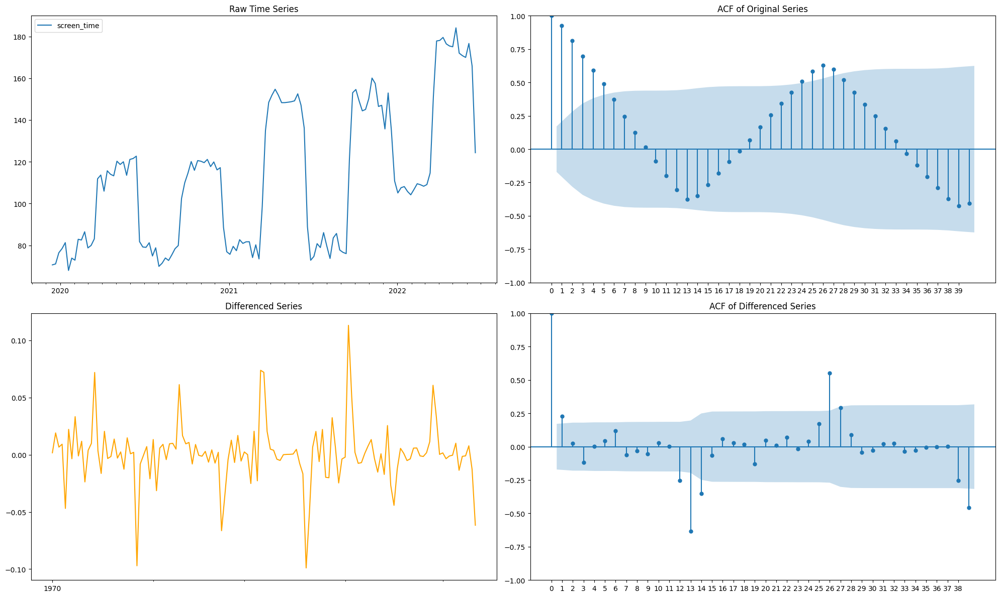

In [18]:
ACF_plot(train_monthly_clean, lags=12)
ACF_plot(train_weekly_clean)

In [19]:
m_monthly = 6
m_weekly = 26
m = 182

# Statistical forecasting

##  Monthly

### Sarima

In [20]:
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import statsmodels.api as sm
from math import log, exp

def invert_boxcox(value, lam):
    if lam == 0:
        return exp(value)
    return exp(log(lam * value + 1) / lam)

def hw_grid_search(train, val, m):
    bc_train, lam = boxcox(train.screen_time)

    best_rmse = float('inf')
    best_params = None

    for trend in ['add', 'add', None]:
        for seasonal in ['add', 'add', None]:
            if trend is None and seasonal is None:
                continue  # skip degenerate case
            model = ExponentialSmoothing(bc_train, 
                                        trend=trend,
                                        seasonal=seasonal,
                                        seasonal_periods=m).fit()
            forecast = model.forecast(steps=len(val))
            original_fore_HW = [invert_boxcox(x, lam) for x in forecast]

            rmse = compute_rmse(actual=val.screen_time.values, forecast=original_fore_HW)
            print(forecast_accuracy(actual=val.screen_time.values, forecast=original_fore_HW))
            print(rmse)

            if rmse < best_rmse:
                best_rmse = rmse
                best_params = (trend, seasonal)

    print(f"Best RMSE: {best_rmse:.4f} with trend={best_params[0]}, seasonal={best_params[1]}")
    
    return best_params

def plot_residuals_HW(HW_fit):
    residuals = HW_fit.resid
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))

    ax[0, 0].plot(residuals)
    ax[0, 0].set_title('Residuals Over Time')

    ax[0, 1].hist(residuals, bins=30, edgecolor='k')
    ax[0, 1].set_title('Histogram of Residuals')

    sm.qqplot(residuals, line='s', ax=ax[1, 0])
    ax[1, 0].set_title('Q-Q Plot')

    sm.graphics.tsa.plot_acf(residuals, ax=ax[1, 1])
    ax[1, 1].set_title('ACF of Residuals')

    plt.tight_layout()
    plt.show()

In [21]:
# SARIMA = pm.auto_arima(train_monthly_clean.screen_time, start_p=1, start_q=1,
#     test='adf', max_p=3, max_q=3, m=m_monthly,
#     start_P=0, seasonal=True,
#     d=d, D=1, trace=True,
#     error_action='ignore',
#     suppress_warnings=True,
#     stepwise=False)

# Best model:  ARIMA(2,1,0)(1,1,0)[6]          
# Total fit time: 9.209 seconds

order = (2, 1, 0) 
seasonal_order = (1, 1, 0, 6)

                                     SARIMAX Results                                     
Dep. Variable:                       screen_time   No. Observations:                   31
Model:             SARIMAX(2, 1, 0)x(1, 1, 0, 6)   Log Likelihood                 -51.711
Date:                           Sat, 26 Jul 2025   AIC                            111.422
Time:                                   18:53:04   BIC                            114.513
Sample:                               12-31-2019   HQIC                           111.581
                                    - 06-30-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4528      0.492      0.921      0.357      -0.511       1.416
ar.L2         -0.6297      0.239     -2.631

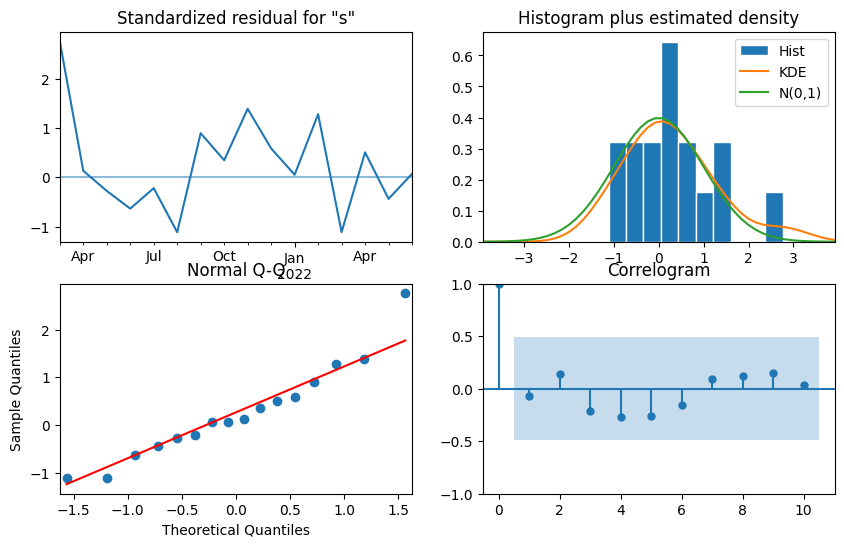

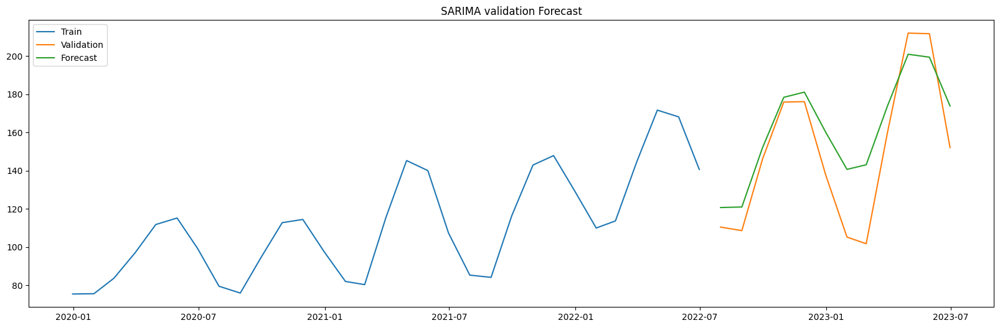

In [22]:
SARIMA_model = SARIMAX(train_monthly_clean.screen_time,
                             order=order,
                             seasonal_order=seasonal_order,
                             enforce_stationarity=False,
                             enforce_invertibility=False)

SARIMA_fit = SARIMA_model.fit()

print(SARIMA_fit.summary())

SARIMA_fit.plot_diagnostics(figsize=(10, 6))

valid_forecast_SARIMA_raw = SARIMA_fit.get_forecast(steps=len(val_monthly))
valid_forecast_SARIMA = valid_forecast_SARIMA_raw.predicted_mean

SARIMA_valid_forecast_accuracy = forecast_accuracy(actual=val_monthly.screen_time, forecast=valid_forecast_SARIMA)

print(SARIMA_valid_forecast_accuracy)

plt.figure(figsize=(20, 6))
plt.plot(train_monthly_clean.screen_time, label='Train')
plt.plot(val_monthly.screen_time, label='Validation')
plt.plot(val_monthly.index, valid_forecast_SARIMA, label='Forecast')
plt.legend()
plt.title('SARIMA validation Forecast')
plt.show()


{'mape': 0.12088390524847985, 'me': 2.5159279805642263, 'mae': 17.502903327693712, 'mpe': 0.048756331474645344, 'rmse': 21.01051765458515, 'corr': 0.919510957790832}
MONTHLY-SARIMA: 21.01051765458515


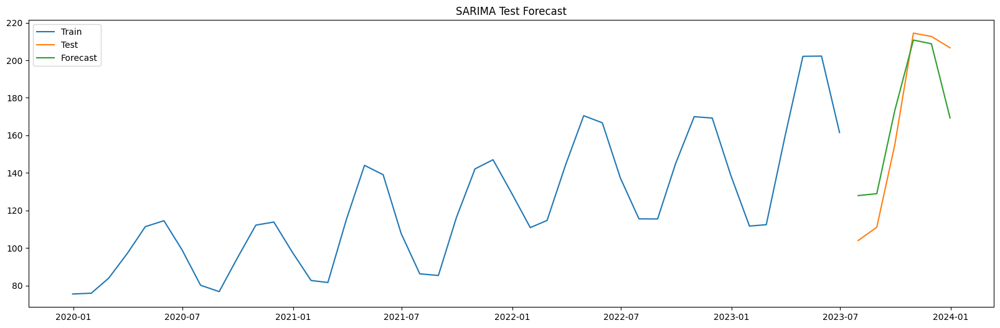

In [23]:
SARIMA_model = SARIMAX(train_complete_monthly_clean.screen_time,
                             order=order,
                             seasonal_order=seasonal_order,
                             enforce_stationarity=False,
                             enforce_invertibility=False)

SARIMA_fit = SARIMA_model.fit()

test_forecast_SARIMA_raw = SARIMA_fit.get_forecast(steps=len(test_monthly))
test_forecast_SARIMA = test_forecast_SARIMA_raw.predicted_mean

SARIMA_test_forecast_accuracy = forecast_accuracy(actual=test_monthly.screen_time, forecast=test_forecast_SARIMA)
print(SARIMA_test_forecast_accuracy)

print(f"MONTHLY-SARIMA: {SARIMA_test_forecast_accuracy['rmse']}")

plt.figure(figsize=(20, 6))
plt.plot(train_complete_monthly_clean.screen_time, label='Train')
plt.plot(test_monthly.screen_time, label='Test')
plt.plot(test_monthly.index, test_forecast_SARIMA, label='Forecast')
plt.legend()
plt.title('SARIMA Test Forecast')
plt.show()

### Holt Winters

In [24]:
bc_train, lam = boxcox(train_monthly_clean.screen_time)

# best_params = hw_grid_search(train_monthly_clean, val_monthly, m_monthly)

# Best RMSE: 16.3650 with trend=None, seasonal=add

best_params = (None, 'add')

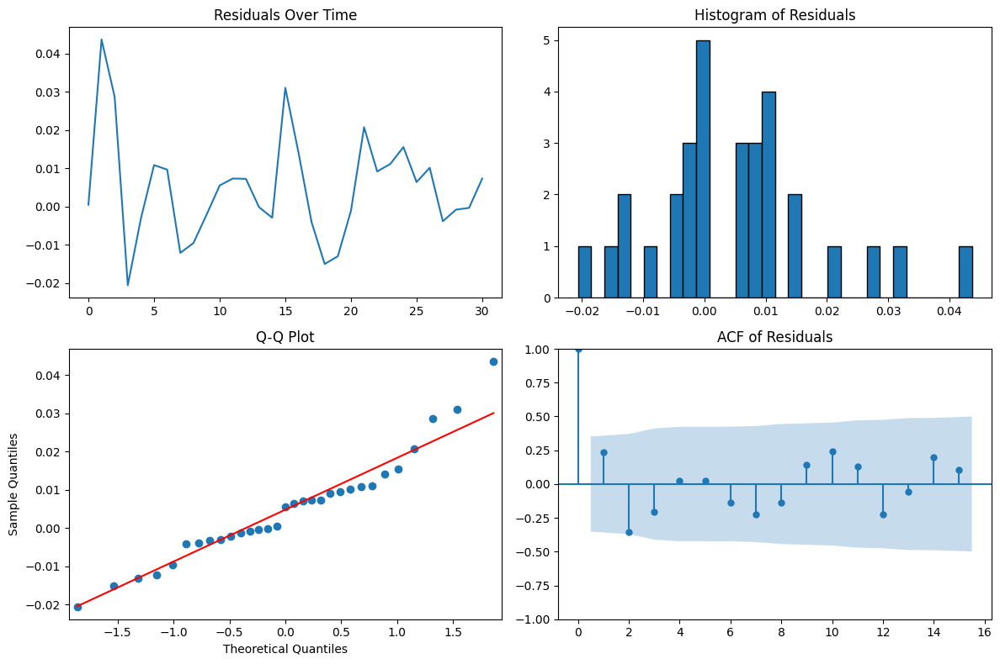

{'mape': 0.07340662279090776, 'me': -4.471367005034222, 'mae': 11.593965680397543, 'mpe': -0.009142703475429611, 'rmse': 16.36503975255498, 'corr': 0.9526941695821842}


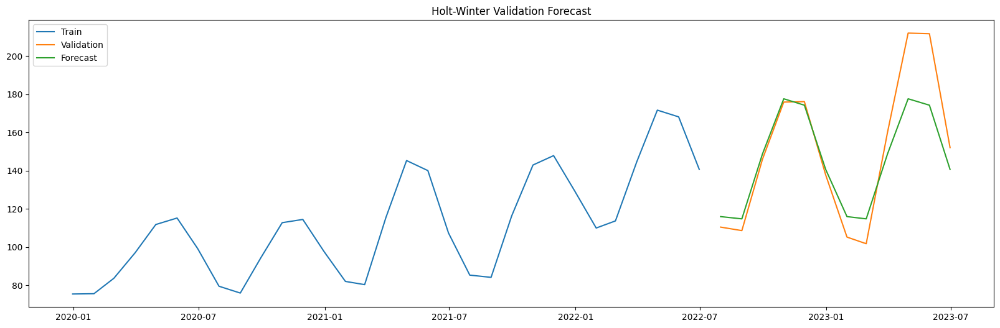

In [25]:
HW = ExponentialSmoothing(bc_train, seasonal_periods=m_monthly,trend=best_params[0],
    seasonal =best_params[1],
    use_boxcox = False,
    initialization_method = "estimated")

HW_fit = HW.fit()
plot_residuals_HW(HW_fit)


valid_forecast_HW = HW_fit.predict(len(train_monthly_clean.screen_time.values), len(train_monthly_clean.screen_time.values)+len(val_monthly)-1)
original_valid_forecast_fore_HW = [invert_boxcox(x, lam) for x in valid_forecast_HW]

HW_valid_forecast_accuracy = forecast_accuracy(actual=val_monthly.screen_time, forecast=original_valid_forecast_fore_HW)
print(HW_valid_forecast_accuracy)

plt.figure(figsize=(20, 6))
plt.plot(train_monthly_clean.screen_time, label='Train')
plt.plot(val_monthly.screen_time, label='Validation')
plt.plot(val_monthly.index, original_valid_forecast_fore_HW, label='Forecast')
plt.legend()
plt.title(f'Holt-Winter Validation Forecast')
plt.show()

{'mape': 0.15150974155662156, 'me': -0.3130514814661467, 'mae': 22.610140758665114, 'mpe': 0.0418071948850749, 'rmse': 25.507714153631877, 'corr': 0.8849626689189454}
MONTHLY-HW: 25.507714153631877


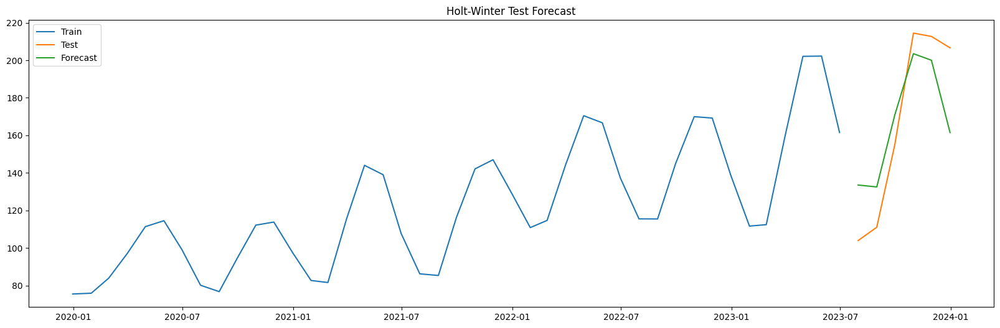

In [26]:
bc_train, lam = boxcox(train_complete_monthly_clean.screen_time)

HW = ExponentialSmoothing(bc_train, seasonal_periods=m_monthly,trend=best_params[0],
    seasonal =best_params[1],
    use_boxcox = False,
    initialization_method = "estimated")

HW_fit = HW.fit()

test_forecast_HW = HW_fit.predict(len(train_complete_monthly_clean.screen_time.values), len(train_complete_monthly_clean.screen_time.values)+len(test_monthly)-1)
original_test_forecast_fore_HW = [invert_boxcox(x, lam) for x in test_forecast_HW]


HW_test_forecast_accuracy = forecast_accuracy(actual=test_monthly.screen_time, forecast=original_test_forecast_fore_HW)
print(HW_test_forecast_accuracy)

print(f"MONTHLY-HW: {HW_test_forecast_accuracy['rmse']}")

plt.figure(figsize=(20, 6))
plt.plot(train_complete_monthly_clean.screen_time, label='Train')
plt.plot(test_monthly.screen_time, label='Test')
plt.plot(test_monthly.index, original_test_forecast_fore_HW, label='Forecast')
plt.legend()
plt.title(f'Holt-Winter Test Forecast')
plt.show()

### Comparison Sarima and Holt Winters

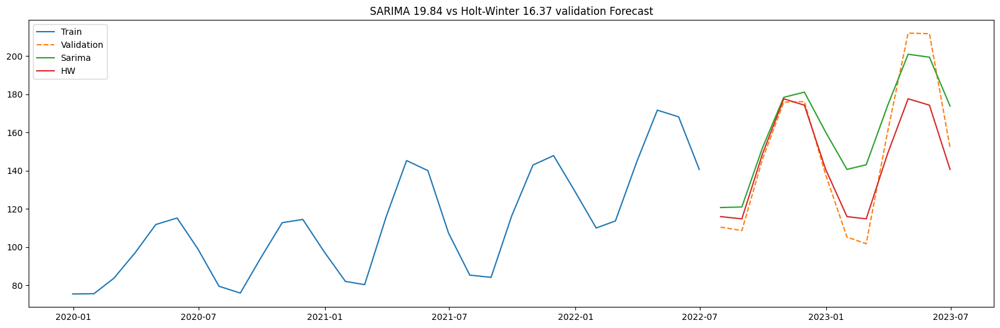

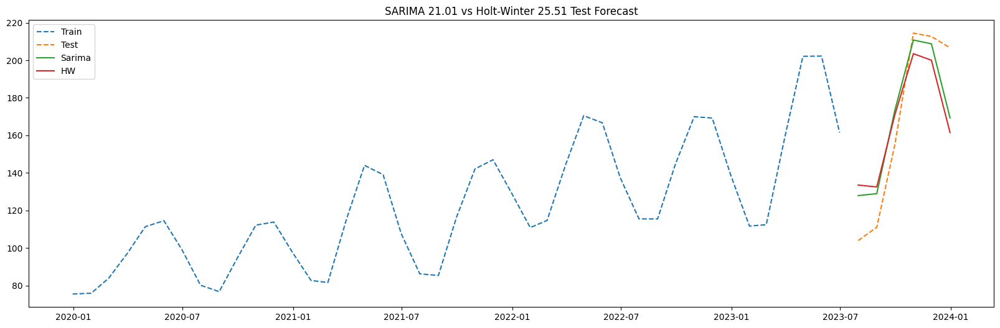

In [27]:
plt.figure(figsize=(20, 6))
plt.plot(train_monthly_clean.screen_time, label='Train')
plt.plot(val_monthly.screen_time, label='Validation', linestyle = '--')
plt.plot(val_monthly.index, valid_forecast_SARIMA, label='Sarima')
plt.plot(val_monthly.index, original_valid_forecast_fore_HW, label='HW')
plt.legend()
plt.title(f'SARIMA {SARIMA_valid_forecast_accuracy['rmse']:.4} vs Holt-Winter {HW_valid_forecast_accuracy['rmse']:.4} validation Forecast')
plt.show()

plt.figure(figsize=(20, 6))
plt.plot(train_complete_monthly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(test_monthly.screen_time, label='Test', linestyle = '--')
plt.plot(test_monthly.index, test_forecast_SARIMA, label='Sarima')
plt.plot(test_monthly.index, original_test_forecast_fore_HW, label='HW')
plt.legend()
plt.title(f'SARIMA {SARIMA_test_forecast_accuracy['rmse']:.4} vs Holt-Winter {HW_test_forecast_accuracy['rmse']:.4} Test Forecast')
plt.show()

## Weekly

### Sarima

In [28]:
# SARIMA = pm.auto_arima(train_weekly_clean.screen_time, start_p=1, start_q=1,
#     test='adf', max_p=3, max_q=3, m=m_weekly,
#     start_P=0, seasonal=True,
#     d=d, D=1, trace=True,
#     error_action='ignore',
#     suppress_warnings=True,
#     stepwise=False)

# Best model: ARIMA(3,1,0)(1,1,0)[26]


order = (3, 1, 0) 
seasonal_order = (1, 1, 0, 26) 

                                     SARIMAX Results                                      
Dep. Variable:                        screen_time   No. Observations:                  132
Model:             SARIMAX(3, 1, 0)x(1, 1, 0, 26)   Log Likelihood                -263.150
Date:                            Sat, 26 Jul 2025   AIC                            536.301
Time:                                    18:53:06   BIC                            547.954
Sample:                                12-15-2019   HQIC                           540.958
                                     - 06-19-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0262      0.086      0.306      0.760      -0.142       0.194
ar.L2         -0.0410      0.104   

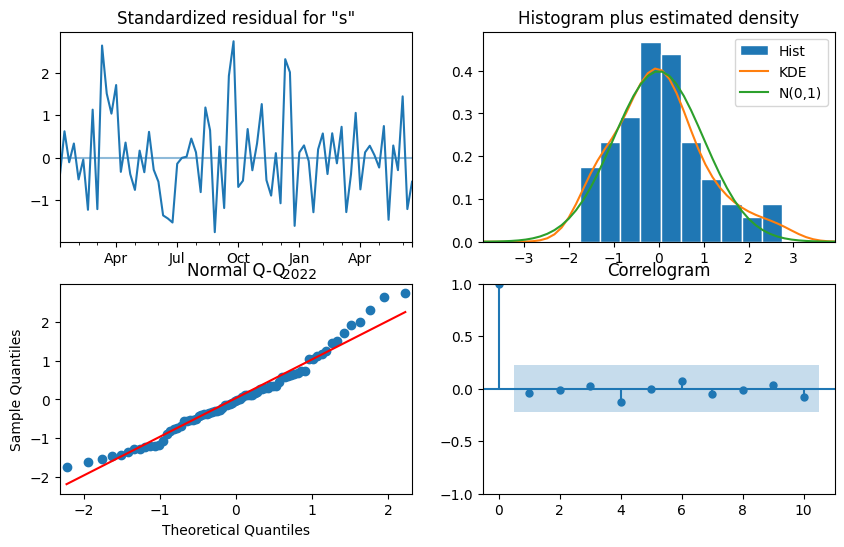

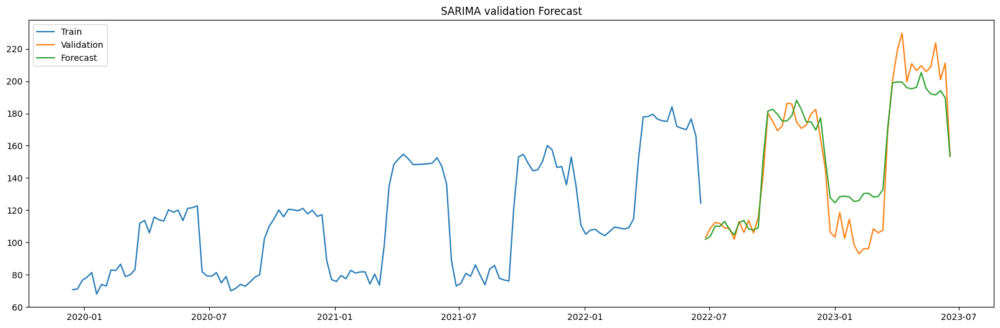

In [29]:
SARIMA_model = SARIMAX(train_weekly_clean.screen_time,
                             order=order,
                             seasonal_order=seasonal_order,
                             enforce_stationarity=False,
                             enforce_invertibility=False)

SARIMA_fit = SARIMA_model.fit()


print(SARIMA_fit.summary())

SARIMA_fit.plot_diagnostics(figsize=(10, 6))

valid_forecast_SARIMA = SARIMA_fit.get_forecast(steps=len(val_weekly))
valid_forecast_SARIMA = valid_forecast_SARIMA.predicted_mean

SARIMA_valid_forecast_accuracy = forecast_accuracy(actual=val_weekly.screen_time, forecast=valid_forecast_SARIMA)
print(SARIMA_valid_forecast_accuracy)


print(SARIMA_valid_forecast_accuracy)

plt.figure(figsize=(20, 6))
plt.plot(train_weekly_clean.screen_time, label='Train')
plt.plot(val_weekly.screen_time, label='Validation')
plt.plot(val_weekly.index, valid_forecast_SARIMA, label='Forecast')
plt.legend()
plt.title('SARIMA validation Forecast')
plt.show()

{'mape': 0.19976283992716676, 'me': 22.261813669471124, 'mae': 24.779076571285426, 'mpe': 0.18805898727999762, 'rmse': 28.46938010732499, 'corr': 0.9631345390241767}
WEEKLY-SARIMA: 28.46938010732499


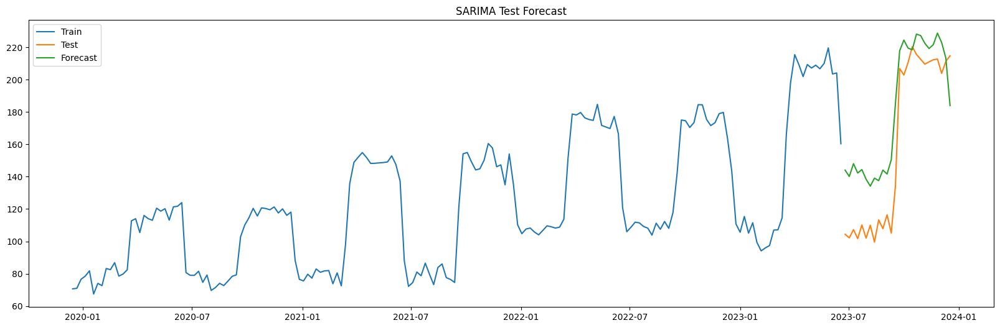

In [30]:
# TRAIN ON TRAIN COMPLETE
SARIMA_model = SARIMAX(train_complete_weekly_clean.screen_time,
                             order=order,
                             seasonal_order=seasonal_order,
                             enforce_stationarity=False,
                             enforce_invertibility=False)

SARIMA_fit = SARIMA_model.fit()
test_forecast_SARIMA_raw = SARIMA_fit.get_forecast(steps=len(test_weekly))
test_forecast_SARIMA = test_forecast_SARIMA_raw.predicted_mean

SARIMA_test_forecast_accuracy = forecast_accuracy(actual=test_weekly.screen_time, forecast=test_forecast_SARIMA)
print(SARIMA_test_forecast_accuracy)

print(f"WEEKLY-SARIMA: {SARIMA_test_forecast_accuracy['rmse']}")

plt.figure(figsize=(20, 6))
plt.plot(train_complete_weekly_clean.screen_time, label='Train')
plt.plot(test_weekly.screen_time, label='Test')
plt.plot(test_weekly.index, test_forecast_SARIMA, label='Forecast')
plt.legend()
plt.title('SARIMA Test Forecast')
plt.show()

### Holt Winters

In [31]:
bc_train, lam = boxcox(train_weekly_clean.screen_time)

# best_params = hw_grid_search(train_weekly_clean, val_weekly, m_weekly)

# Best RMSE: 20.0635 with trend=None, seasonal=add

best_params = (None, 'add')

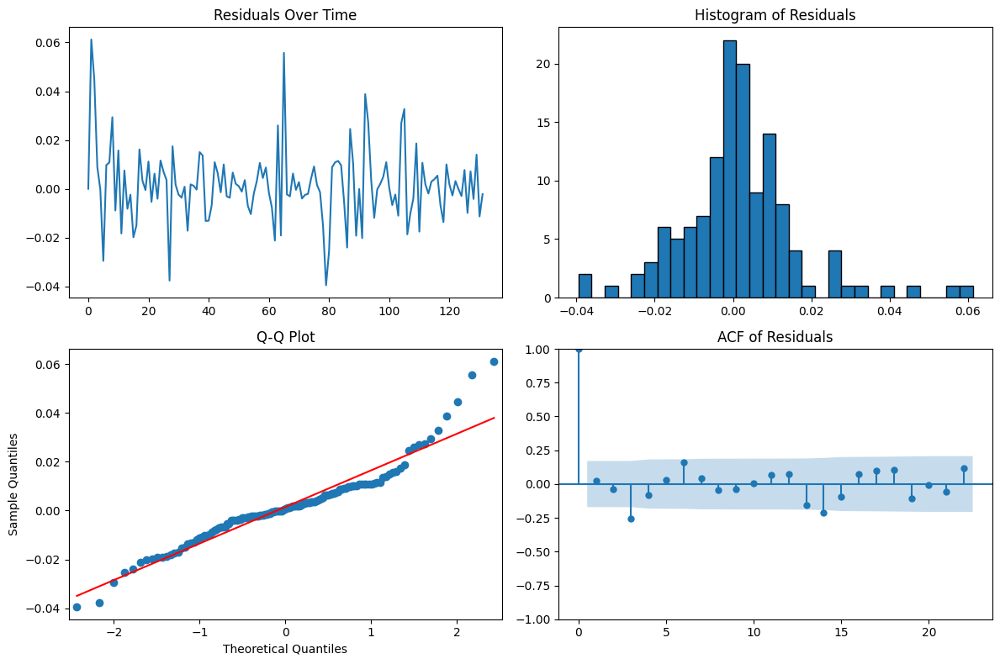

{'mape': 0.0818645206655837, 'me': -8.713863252288776, 'mae': 13.923786992127747, 'mpe': -0.035679085392135504, 'rmse': 20.063463740456037, 'corr': 0.9368654243559155}


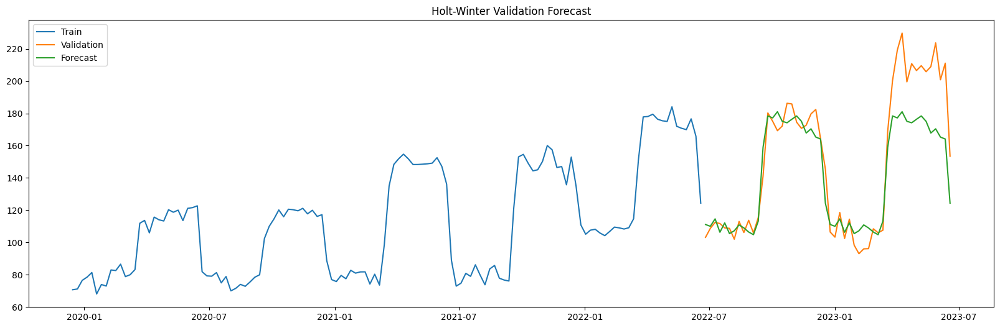

In [32]:
HW = ExponentialSmoothing(bc_train, seasonal_periods=m_weekly,trend=best_params[0],
    seasonal =best_params[1],
    use_boxcox = False,
    initialization_method = "estimated")

HW_fit = HW.fit()
plot_residuals_HW(HW_fit)


valid_forecast_HW = HW_fit.predict(len(train_weekly_clean.screen_time.values), len(train_weekly_clean.screen_time.values)+len(val_weekly)-1)
original_valid_forecast_fore_HW = [invert_boxcox(x, lam) for x in valid_forecast_HW]

HW_valid_forecast_accuracy = forecast_accuracy(actual=val_weekly.screen_time, forecast=original_valid_forecast_fore_HW)
print(HW_valid_forecast_accuracy)

plt.figure(figsize=(20, 6))
plt.plot(train_weekly_clean.screen_time, label='Train')
plt.plot(val_weekly.screen_time, label='Validation')
plt.plot(val_weekly.index, original_valid_forecast_fore_HW, label='Forecast')
plt.legend()
plt.title(f'Holt-Winter Validation Forecast')
plt.show()

{'mape': 0.18585560526771408, 'me': 19.911059188622577, 'mae': 24.180014243661024, 'mpe': 0.1659733656604318, 'rmse': 28.327879874512654, 'corr': 0.9260572380911759}
WEEKLY-HW: 28.327879874512654


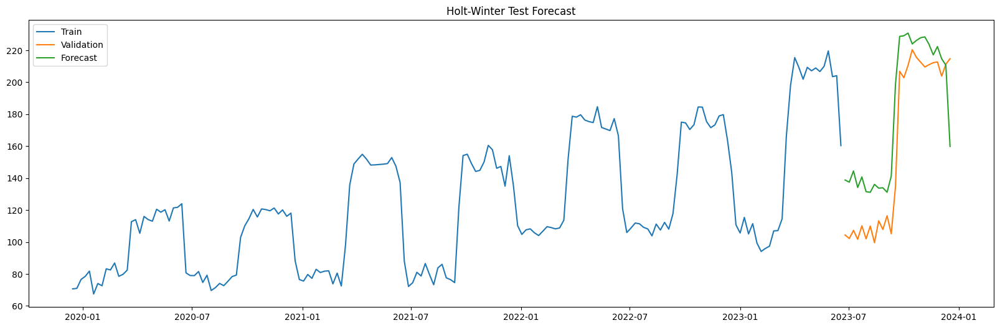

In [33]:
bc_train, lam = boxcox(train_complete_weekly_clean.screen_time)

HW = ExponentialSmoothing(bc_train, seasonal_periods=m_weekly,trend=best_params[0],
    seasonal =best_params[1],
    use_boxcox = False,
    initialization_method = "estimated")

HW_fit = HW.fit()

test_forecast_HW = HW_fit.predict(len(train_complete_weekly_clean.screen_time.values), len(train_complete_weekly_clean.screen_time.values)+len(test_weekly)-1)
original_test_forecast_fore_HW = [invert_boxcox(x, lam) for x in test_forecast_HW]


HW_test_forecast_accuracy = forecast_accuracy(actual=test_weekly.screen_time, forecast=original_test_forecast_fore_HW)
print(HW_test_forecast_accuracy)

print(f"WEEKLY-HW: {HW_test_forecast_accuracy['rmse']}")

plt.figure(figsize=(20, 6))
plt.plot(train_complete_weekly_clean.screen_time, label='Train')
plt.plot(test_weekly.screen_time, label='Validation')
plt.plot(test_weekly.index, original_test_forecast_fore_HW, label='Forecast')
plt.legend()
plt.title(f'Holt-Winter Test Forecast')
plt.show()

### WEEKLY COMPARISON SARIMA AND HW

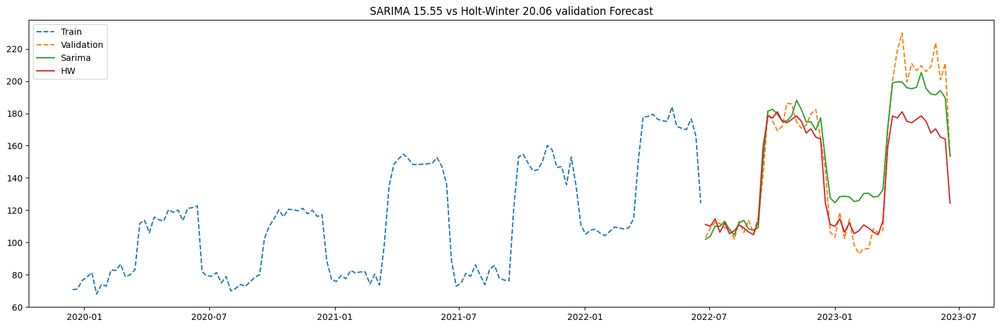

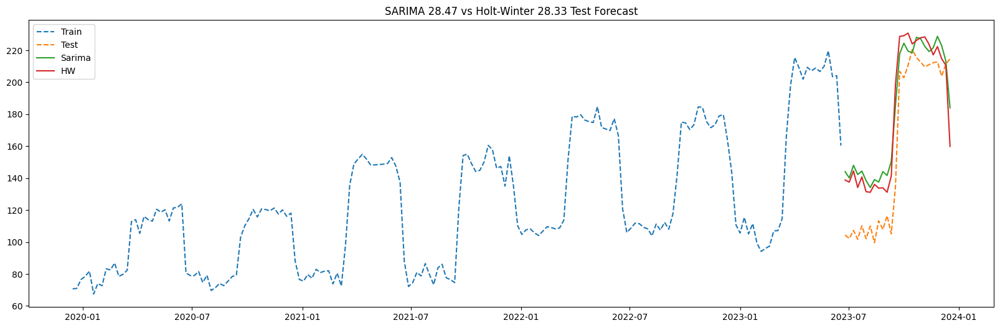

In [34]:
plt.figure(figsize=(20, 6))
plt.plot(train_weekly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(val_weekly.screen_time, label='Validation', linestyle = '--')
plt.plot(val_weekly.index, valid_forecast_SARIMA, label='Sarima')
plt.plot(val_weekly.index, original_valid_forecast_fore_HW, label='HW')
plt.legend()
plt.title(f'SARIMA {SARIMA_valid_forecast_accuracy['rmse']:.4} vs Holt-Winter {HW_valid_forecast_accuracy['rmse']:.4} validation Forecast')
plt.show()

plt.figure(figsize=(20, 6))
plt.plot(train_complete_weekly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(test_weekly.screen_time, label='Test', linestyle = '--')
plt.plot(test_weekly.index, test_forecast_SARIMA, label='Sarima')
plt.plot(test_weekly.index, original_test_forecast_fore_HW, label='HW')
plt.legend()
plt.title(f'SARIMA {SARIMA_test_forecast_accuracy['rmse']:.4} vs Holt-Winter {HW_test_forecast_accuracy['rmse']:.4} Test Forecast')
plt.show()

## Holt Winters on original time series

In [35]:
bc_train, lam = boxcox(train_clean.screen_time)

# best_params = hw_grid_search(train_clean, val, m)

# Best RMSE: 20.0635 with trend=None, seasonal=add

best_params = (None, 'add')

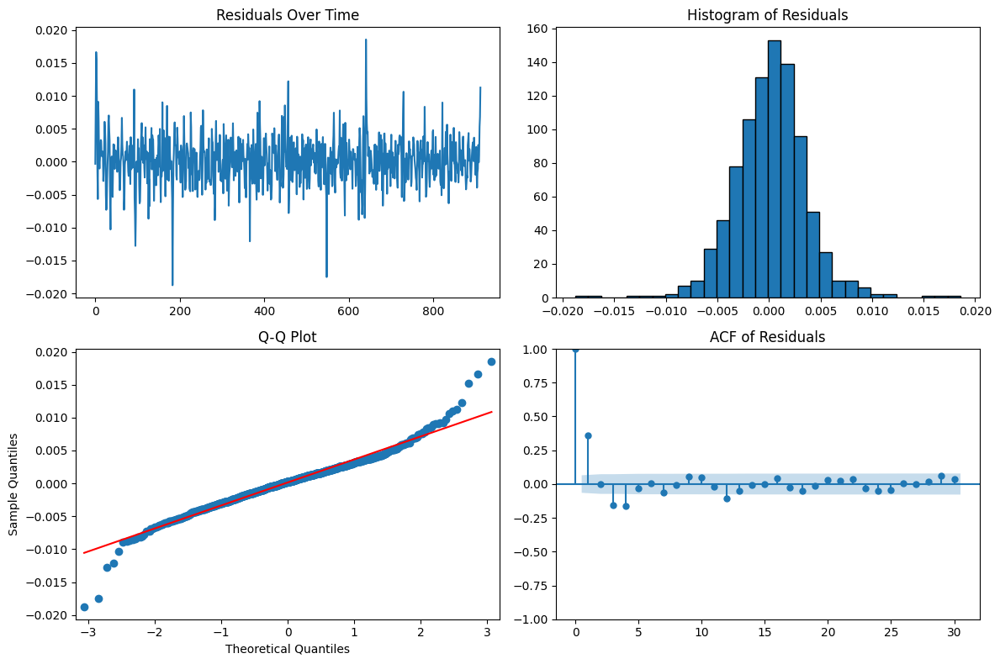

{'mape': 0.28143289456333687, 'me': 35.338745761341634, 'mae': 37.40052523611654, 'mpe': 0.2707807923832965, 'rmse': 44.30867261586694, 'corr': 0.8664060365709663}


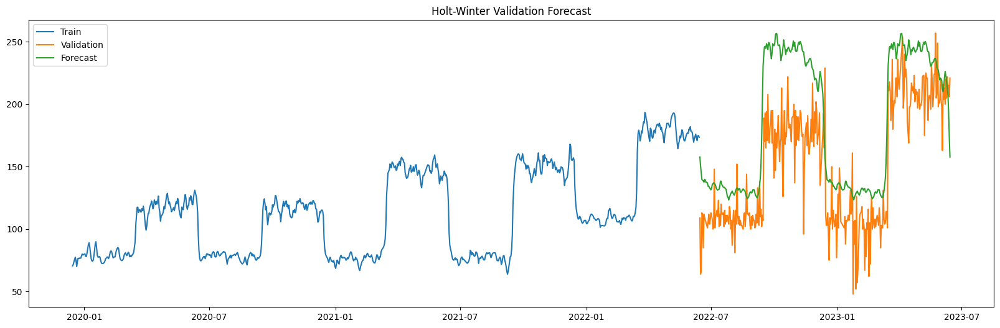

In [36]:
HW = ExponentialSmoothing(bc_train, seasonal_periods=m,trend=best_params[0],
    seasonal =best_params[1],
    use_boxcox = False,
    initialization_method = "estimated")

HW_fit = HW.fit()
plot_residuals_HW(HW_fit)


valid_forecast_HW = HW_fit.predict(len(train_clean.screen_time.values), len(train_clean.screen_time.values)+len(val)-1)
original_valid_forecast_fore_HW = [invert_boxcox(x, lam) for x in valid_forecast_HW]

HW_valid_forecast_accuracy = forecast_accuracy(actual=val.screen_time, forecast=original_valid_forecast_fore_HW)
print(HW_valid_forecast_accuracy)

plt.figure(figsize=(20, 6))
plt.plot(train_clean.screen_time, label='Train')
plt.plot(val.screen_time, label='Validation')
plt.plot(val.index, original_valid_forecast_fore_HW, label='Forecast')
plt.legend()
plt.title(f'Holt-Winter Validation Forecast')
plt.show()

{'mape': 0.5882300766889234, 'me': 83.13356095680528, 'mae': 83.3979949870253, 'mpe': 0.5870548143323898, 'rmse': 87.99137212145786, 'corr': 0.9087920087222328}
ORIGINAL-HW: 87.99137212145786


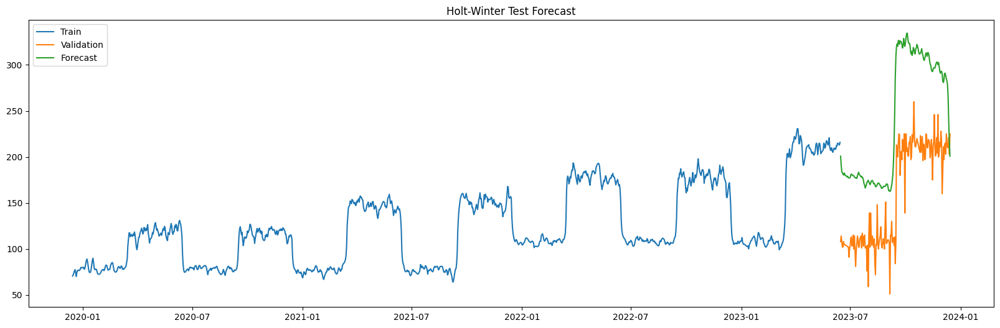

In [37]:
train_complete_clean = clean(train_complete)
bc_train, lam = boxcox(train_complete_clean.screen_time)

HW = ExponentialSmoothing(bc_train, seasonal_periods=m,trend=best_params[0],
    seasonal =best_params[1],
    use_boxcox = False,
    initialization_method = "estimated")

HW_fit = HW.fit()

test_forecast_HW = HW_fit.predict(len(train_complete_clean.screen_time.values), len(train_complete_clean.screen_time.values)+len(test)-1)
original_test_forecast_fore_HW = [invert_boxcox(x, lam) for x in test_forecast_HW]


HW_test_forecast_accuracy = forecast_accuracy(actual=test.screen_time, forecast=original_test_forecast_fore_HW)
print(HW_test_forecast_accuracy)

print(f"ORIGINAL-HW: {HW_test_forecast_accuracy['rmse']}")

plt.figure(figsize=(20, 6))
plt.plot(train_complete_clean.screen_time, label='Train')
plt.plot(test.screen_time, label='Validation')
plt.plot(test.index, original_test_forecast_fore_HW, label='Forecast')
plt.legend()
plt.title(f'Holt-Winter Test Forecast')
plt.show()

# Neural forecasting

In [38]:
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import itertools
import random
from torch.utils.data import TensorDataset, DataLoader

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.use_deterministic_algorithms(True)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def create_dataset(arrdata, look_back=1):
    dataX, dataY = [], []
    for i in range(len(arrdata) - look_back):
        a = arrdata[i:(i + look_back)]
        dataX.append(a)
        dataY.append(arrdata[i + look_back])
    return torch.tensor(dataX, dtype=torch.float32), torch.tensor(dataY, dtype=torch.float32)

def plot_results(df, actual_index, actual, predicted, title):
    plt.figure(figsize=(20, 5))
    plt.plot(df.screen_time, label='Series')
    plt.plot(actual_index, actual, label='Actual')
    plt.plot(actual_index, predicted, label='Predicted')
    plt.xlabel('Date')
    plt.ylabel('Screen Time')
    plt.legend()
    plt.title(title)
    plt.show()

## LSTM model

In [39]:
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_size=24, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers,
        batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])
    
def train_LSTM_model(model, train_loader, optimizer, loss_fn, epochs):
    for epoch in range(epochs):
        model.train()
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            output = model(batch_x)
            loss = loss_fn(output, batch_y)
            loss.backward()
            optimizer.step()


def forecast_LSTM(model, input_seq, forecast_horizon):
    model.eval()
    predictions = []
    seq = input_seq.clone()
    for _ in range(forecast_horizon):
        with torch.no_grad():
            pred = model(seq)
            predictions.append(pred.item())
            new_input = pred.unsqueeze(1)
            seq = torch.cat((seq[:, 1:, :], new_input), dim=1)
    return np.array(predictions)

def grid_search(train_scaled, val, seq_length, scaler):
    best_rmse = float('inf')
    best_model = None
    best_params = None

    hidden_sizes    = [125]
    num_layers_list = [2]
    learning_rates  = [0.001, 0.01, 0.05, 0.005]
    epoch_list      = [30, 50, 75, 100]
    batch_sizes     = [16, 32]
    for hidden_size, num_layers, lr, epochs, batch_size in itertools.product(hidden_sizes, num_layers_list, learning_rates, epoch_list, batch_sizes):
        set_seed(42)

        model = LSTM(hidden_size=hidden_size, num_layers=num_layers)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        loss_fn = nn.MSELoss()

        X_train, y_train = create_dataset(train_scaled, seq_length)
        train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=False)

        train_LSTM_model(model, train_loader, optimizer, loss_fn, epochs)

        input_seq = torch.tensor(train_scaled[-seq_length:], dtype=torch.float32).unsqueeze(0)
        predictions = forecast_LSTM(model, input_seq, forecast_horizon=len(val))
        pred_inv = scaler.inverse_transform(predictions.reshape(-1, 1))

        rmse = np.sqrt(mean_squared_error(val['screen_time'].values, pred_inv))

        print(f"Hidden: {hidden_size}, Layers: {num_layers}, LR: {lr}, Epochs: {epochs}, Batch:{batch_size}, RMSE: {rmse:.2f}")

        if rmse < best_rmse:
            best_rmse = rmse
            best_model = model
            best_params = (hidden_size, num_layers, lr, epochs, batch_size)

    print(f"\nBest RMSE: {best_rmse:.2f} with Hidden: {best_params[0]}, Layers: {best_params[1]}, LR: {best_params[2]}, Epochs: {best_params[3]}, Batch:{best_params[4]}")
    return best_model, best_params, best_rmse

## MLP model

In [40]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers=1):
        super().__init__()
        layers = []
        layers.append(nn.Linear(input_size, hidden_size))
        layers.append(nn.ReLU())

        for _ in range(num_layers - 1):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.ReLU())

        layers.append(nn.Linear(hidden_size, 1))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)
    
def train_mlp_model(model, train_loader, optimizer, loss_fn, epochs):
    for epoch in range(epochs):
        model.train()
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            output = model(batch_x)
            loss = loss_fn(output, batch_y)
            loss.backward()
            optimizer.step()

def forecast_iterative(model, input_seq, n_steps):
    model.eval()
    preds = []
    input_seq = input_seq.clone().detach()
    
    for _ in range(n_steps):
        with torch.no_grad():
            input_batch = input_seq.unsqueeze(0).float()  
            pred = model(input_batch).item()
            preds.append(pred)
        
            input_seq = torch.cat((input_seq[1:], torch.tensor([pred])))
    
    return np.array(preds)

def grid_search_mlp(X_train, y_train, X_val, y_val, input_size, val_original, scaler):
    best_rmse = float('inf')
    best_model = None
    best_params = None

    hidden_sizes    = [2 * input_size + 1, 2 * input_size, input_size]
    num_layers_list = [1, 2, 3]
    learning_rates  = [0.001, 0.0005, 0.005]
    epoch_list      = [50, 100, 150]
    batch_sizes     = [16, 32, 64]

    for hidden_size, num_layers, lr, epochs, batch_size in itertools.product(
        hidden_sizes, num_layers_list, learning_rates, epoch_list, batch_sizes):

        set_seed(42)
        model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        loss_fn = nn.MSELoss()

        train_dataset = TensorDataset(X_train, y_train)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

        train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

        last_window = X_val[-1].squeeze()


        preds_scaled = forecast_iterative(model, last_window, len(val_original))
        preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()
        rmse = np.sqrt(mean_squared_error(val_original, preds_orig))

        print(f"Hidden:{hidden_size} Layers:{num_layers} LR:{lr} Epochs:{epochs} Batch:{batch_size} RMSE:{rmse:.2f}")

        if rmse < best_rmse:
            best_rmse = rmse
            best_model = model
            best_params = (hidden_size, num_layers, lr, epochs, batch_size)

    print(f"\nBest RMSE: {best_rmse:.2f} with Params: {best_params}")
    return best_model, best_params, best_rmse

## Monthly

### LSTM

In [41]:
set_seed(42)
scaler = MinMaxScaler()
seq_length = m_monthly

train_scaled = scaler.fit_transform(train_monthly_clean[['screen_time']].values)

# best_model, best_params, best_rmse = grid_search(train_scaled, val_monthly, seq_length, scaler)
# Best RMSE: 21.36 with Hidden: 150, Layers: 2, LR: 0.01, Epochs: 50, Batch:16
hidden_size, num_layers, lr, epochs, batch_size = (150, 2, 0.01, 50, 16)

Final RMSE on val: 21.36


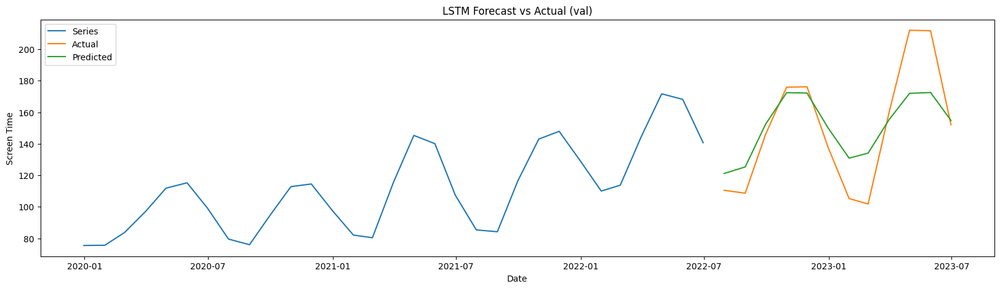

In [42]:
set_seed(42)

model = LSTM(hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_monthly_clean[['screen_time']].values)
X_train, y_train = create_dataset(train_scaled, seq_length)
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=False)

train_LSTM_model(model, train_loader, optimizer, loss_fn, epochs)

input_seq = torch.tensor(train_scaled[-seq_length:], dtype=torch.float32).unsqueeze(0)
predictions_val = forecast_LSTM(model, input_seq, len(val_monthly))
valid_forecast_LSTM = scaler.inverse_transform(predictions_val.reshape(-1, 1))

LSTM_rmse_val = np.sqrt(mean_squared_error(val_monthly['screen_time'].values, valid_forecast_LSTM))

print(f'Final RMSE on val: {LSTM_rmse_val:.2f}')

plot_results(train_monthly_clean, val_monthly.index, val_monthly['screen_time'].values, valid_forecast_LSTM, 'LSTM Forecast vs Actual (val)')


MONTHLY-LSTM: 15.92


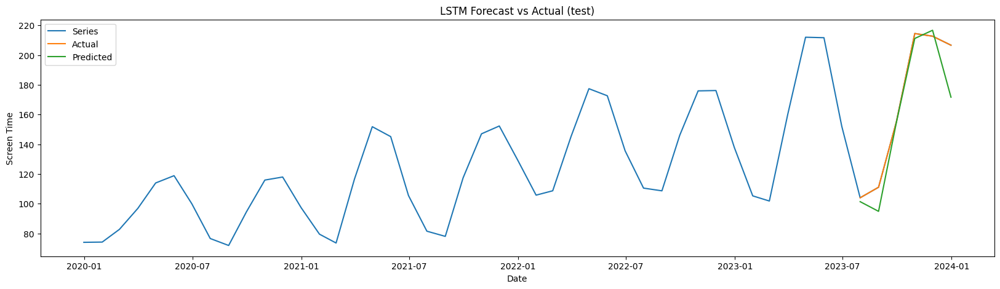

In [43]:
set_seed(42)

model = LSTM(hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_complete_monthly_clean[['screen_time']].values)
X_train, y_train = create_dataset(train_scaled, seq_length)
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=False)

train_LSTM_model(model, train_loader, optimizer, loss_fn, epochs)

input_seq = torch.tensor(train_scaled[-seq_length:], dtype=torch.float32).unsqueeze(0)
predictions_test = forecast_LSTM(model, input_seq, len(test_monthly))
test_forecast_LSTM = scaler.inverse_transform(predictions_test.reshape(-1, 1))

LSTM_rmse_test = np.sqrt(mean_squared_error(test_monthly['screen_time'].values, test_forecast_LSTM))
print(f'MONTHLY-LSTM: {LSTM_rmse_test:.2f}')

plot_results(df_monthly, test_monthly.index, test_monthly['screen_time'].values, test_forecast_LSTM, 'LSTM Forecast vs Actual (test)')

### MLP

In [44]:
input_size = m_monthly 
set_seed(42)
scaler = StandardScaler()

train_scaled_monthly = scaler.fit_transform(train_monthly_clean['screen_time'].values.reshape(-1,1)).ravel()
val_scaled_monthly = scaler.transform(val_monthly['screen_time'].values.reshape(-1,1)).ravel()

X_train, y_train = create_dataset(train_scaled_monthly, m_monthly)
X_val, y_val = create_dataset(val_scaled_monthly, m_monthly)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# best_model, best_params, best_rmse = grid_search_mlp(X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor, input_size, val_monthly['screen_time'].values, scaler)
# Best RMSE: 33.11 with Params: (12, 2, 0.001, 100, 32)

hidden_size, num_layers, lr, epochs, batch_size = (12, 2, 0.001, 100, 32)

33.11


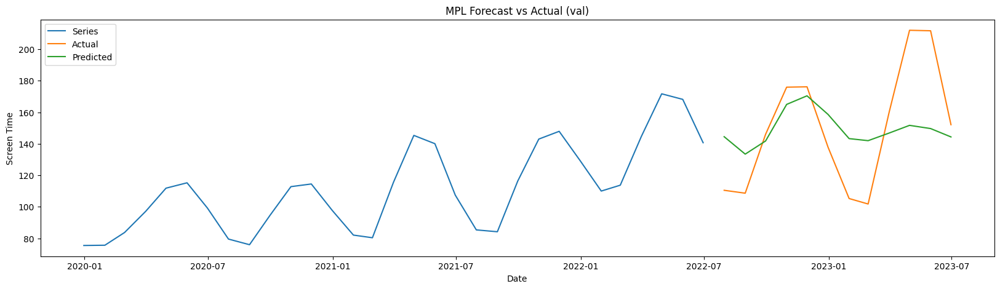

In [45]:
set_seed(42)
model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

last_window = X_val_tensor[-1].squeeze()

preds_scaled = forecast_iterative(model, last_window, len(val_monthly))
MLP_val_preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()

MLP_rmse_val = np.sqrt(mean_squared_error(val_monthly.screen_time.values, MLP_val_preds_orig))
print(f'{MLP_rmse_val:.2f}')
plot_results(train_monthly_clean, val_monthly.index, val_monthly['screen_time'].values, MLP_val_preds_orig, 'MPL Forecast vs Actual (val)')

MONTHLY-MLP: 50.53


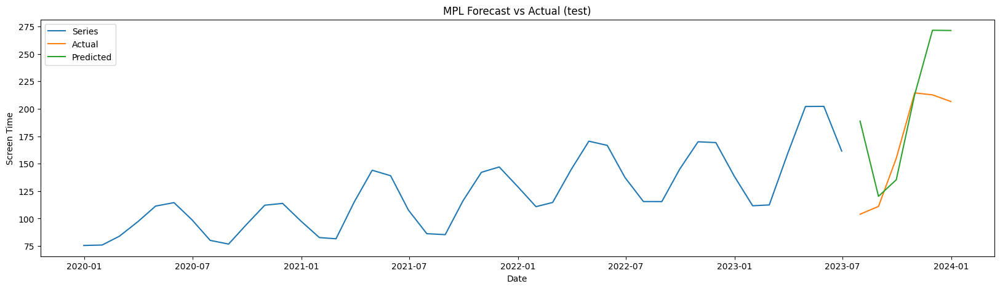

In [46]:
set_seed(42)
train_scaled_monthly = scaler.fit_transform(train_complete_monthly_clean['screen_time'].values.reshape(-1,1)).ravel()
test_scaled_monthly = scaler.transform(test_monthly['screen_time'].values.reshape(-1,1)).ravel()

X_train, y_train = create_dataset(train_scaled_monthly, m_monthly)
X_test, y_test = create_dataset(test_scaled_monthly, m_monthly)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

set_seed(42)
model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

last_window = X_val_tensor[-1].squeeze()

preds_scaled = forecast_iterative(model, last_window, len(test_monthly))
MLP_test_preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()

MLP_rmse_test = np.sqrt(mean_squared_error(test_monthly.screen_time.values, MLP_test_preds_orig))
print(f'MONTHLY-MLP: {MLP_rmse_test:.2f}')

plot_results(train_complete_monthly_clean, test_monthly.index, test_monthly['screen_time'].values, MLP_test_preds_orig, 'MPL Forecast vs Actual (test)')


### Comparison between LSTM and MLP

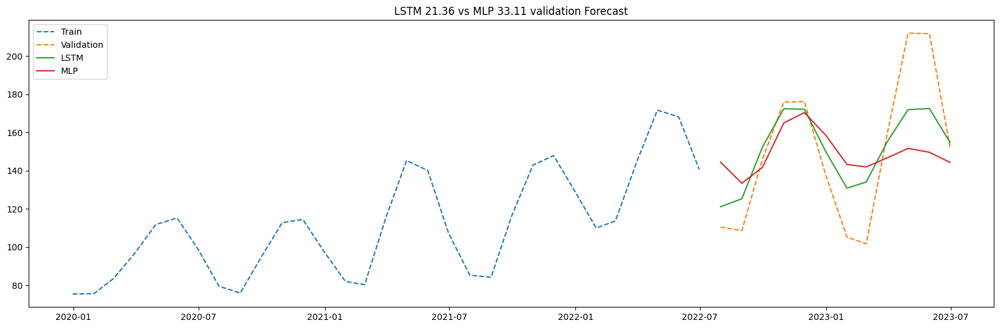

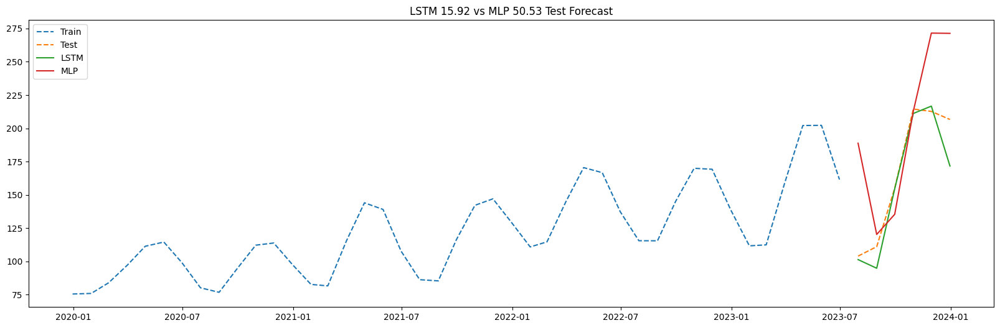

In [47]:
plt.figure(figsize=(20, 6))
plt.plot(train_monthly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(val_monthly.screen_time, label='Validation', linestyle = '--')
plt.plot(val_monthly.index, valid_forecast_LSTM, label='LSTM')
plt.plot(val_monthly.index, MLP_val_preds_orig, label='MLP')
plt.legend()
plt.title(f'LSTM {LSTM_rmse_val:.4} vs MLP {MLP_rmse_val:.4} validation Forecast')
plt.show()

plt.figure(figsize=(20, 6))
plt.plot(train_complete_monthly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(test_monthly.screen_time, label='Test', linestyle = '--')
plt.plot(test_monthly.index, test_forecast_LSTM, label='LSTM')
plt.plot(test_monthly.index, MLP_test_preds_orig, label='MLP')
plt.legend()
plt.title(f'LSTM {LSTM_rmse_test:.4} vs MLP {MLP_rmse_test:.4} Test Forecast')
plt.show()

## Weekly

### LSTM

In [48]:
set_seed(42)
scaler = MinMaxScaler()
seq_length = m_weekly

train_scaled = scaler.fit_transform(train_weekly_clean[['screen_time']].values)

# best_model, best_params, best_rmse = grid_search(train_scaled, val_weekly, seq_length, scaler)
# Best RMSE: 22.55 with Hidden: 100, Layers: 2, LR: 0.001, Epochs: 100, Batch:16

hidden_size, num_layers, lr, epochs, batch_size = (100, 2, 0.001, 100, 16)

Final RMSE on val: 22.55


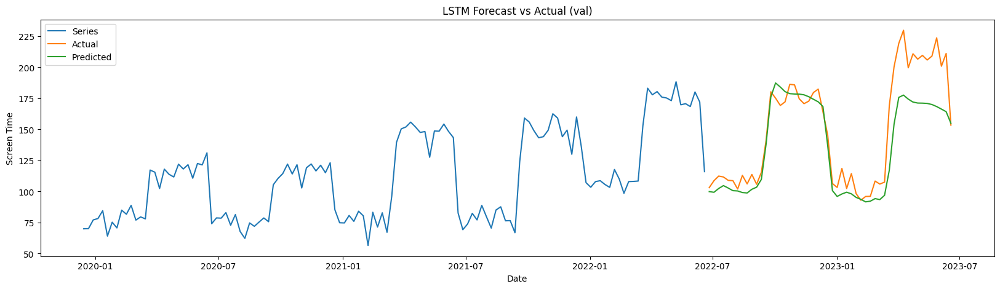

In [49]:
set_seed(42)

model = LSTM(hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_weekly_clean[['screen_time']].values)
X_train, y_train = create_dataset(train_scaled, seq_length)
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=False)

train_LSTM_model(model, train_loader, optimizer, loss_fn, epochs)

input_seq = torch.tensor(train_scaled[-seq_length:], dtype=torch.float32).unsqueeze(0)
predictions_val = forecast_LSTM(model, input_seq, len(val_weekly))
valid_forecast_LSTM = scaler.inverse_transform(predictions_val.reshape(-1, 1))

LSTM_rmse_val = np.sqrt(mean_squared_error(val_weekly['screen_time'].values, valid_forecast_LSTM))

print(f'Final RMSE on val: {LSTM_rmse_val:.2f}')

plot_results(train_weekly, val_weekly.index, val_weekly['screen_time'].values, valid_forecast_LSTM, 'LSTM Forecast vs Actual (val)')

WEEKLY-LSTM: 28.65


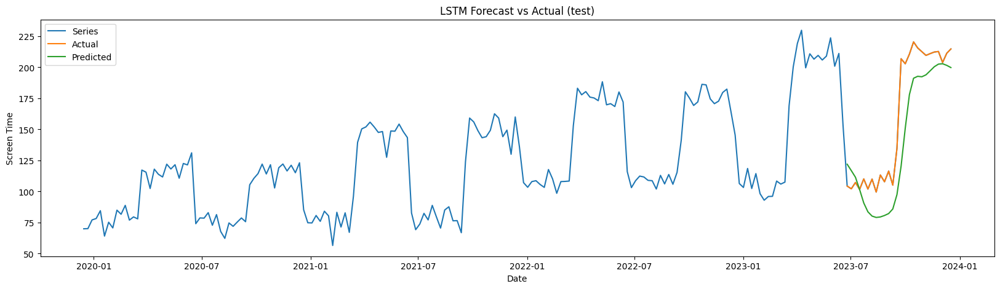

In [50]:
set_seed(42)

model = LSTM(hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_complete_weekly_clean[['screen_time']].values)
X_train, y_train = create_dataset(train_scaled, seq_length)
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=False)

train_LSTM_model(model, train_loader, optimizer, loss_fn, epochs)

input_seq = torch.tensor(train_scaled[-seq_length:], dtype=torch.float32).unsqueeze(0)
predictions_test = forecast_LSTM(model, input_seq, len(test_weekly))
test_forecast_LSTM = scaler.inverse_transform(predictions_test.reshape(-1, 1))

LSTM_rmse_test = np.sqrt(mean_squared_error(test_weekly['screen_time'].values, test_forecast_LSTM))
print(f'WEEKLY-LSTM: {LSTM_rmse_test:.2f}')

plot_results(df_weekly, test_weekly.index, test_weekly['screen_time'].values, test_forecast_LSTM, 'LSTM Forecast vs Actual (test)')


### MLP

In [51]:
input_size = m_weekly 
set_seed(42)
scaler = StandardScaler()

train_scaled_weekly = scaler.fit_transform(train_weekly_clean['screen_time'].values.reshape(-1,1)).ravel()
val_scaled_weekly = scaler.transform(val_weekly['screen_time'].values.reshape(-1,1)).ravel()

X_train, y_train = create_dataset(train_scaled_weekly, m_weekly)
X_val, y_val = create_dataset(val_scaled_weekly, m_weekly)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# best_model, best_params, best_rmse = grid_search_mlp(X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor, input_size, val_weekly['screen_time'].values, scaler)
# Best RMSE: 26.10 with Params: (26, 1, 0.0005, 50, 32)

hidden_size, num_layers, lr, epochs, batch_size = (26, 1, 0.0005, 50, 32)

26.10


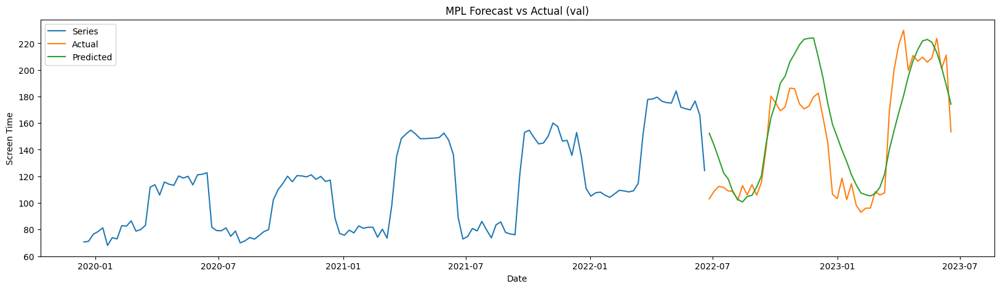

In [52]:
set_seed(42)
model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

last_window = X_val_tensor[-1].squeeze()

preds_scaled = forecast_iterative(model, last_window, len(val_weekly))
MLP_val_preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()

MLP_rmse_val = np.sqrt(mean_squared_error(val_weekly.screen_time.values, MLP_val_preds_orig))
print(f'{MLP_rmse_val:.2f}')
plot_results(train_weekly_clean, val_weekly.index, val_weekly['screen_time'].values, MLP_val_preds_orig, 'MPL Forecast vs Actual (val)')

WEEKLY-MLP 36.39


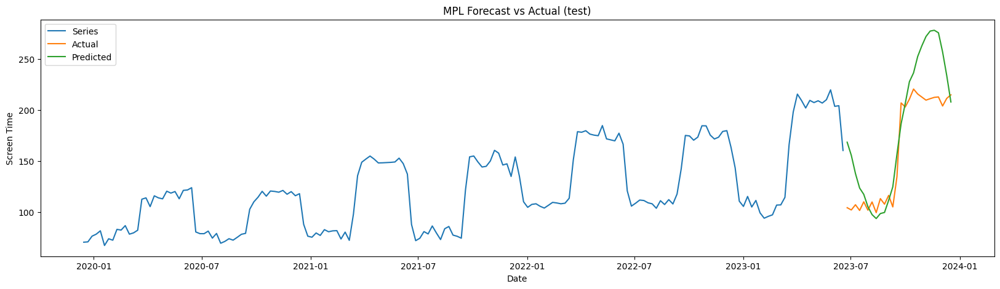

In [53]:
set_seed(42)
train_scaled_weekly = scaler.fit_transform(train_complete_weekly_clean['screen_time'].values.reshape(-1,1)).ravel()
test_scaled_weekly = scaler.transform(test_weekly['screen_time'].values.reshape(-1,1)).ravel()

X_train, y_train = create_dataset(train_scaled_weekly, m_weekly)
X_test, y_test = create_dataset(test_scaled_weekly, m_weekly)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

set_seed(42)
model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

last_window = X_val_tensor[-1].squeeze()

preds_scaled = forecast_iterative(model, last_window, len(test_weekly))
MLP_test_preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()

MLP_rmse_test = np.sqrt(mean_squared_error(test_weekly.screen_time.values, MLP_test_preds_orig))
print(f'WEEKLY-MLP {MLP_rmse_test:.2f}')

plot_results(train_complete_weekly_clean, test_weekly.index, test_weekly['screen_time'].values, MLP_test_preds_orig, 'MPL Forecast vs Actual (test)')


### Comparison between LSTM and MLP

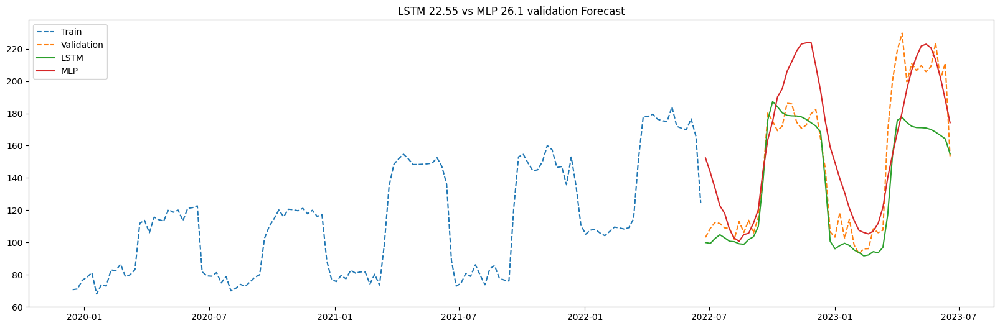

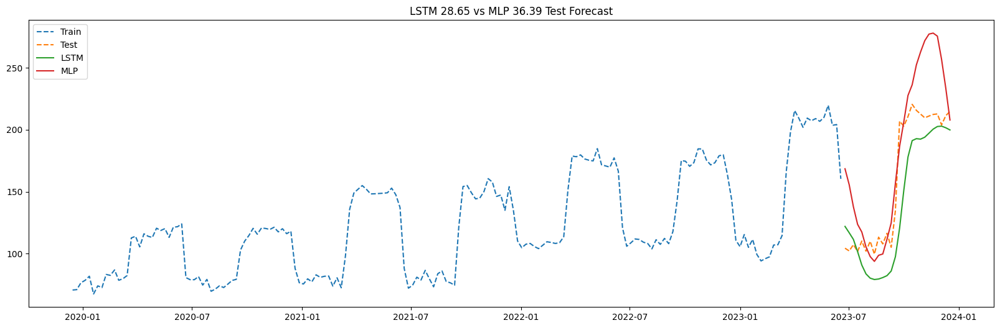

In [54]:
plt.figure(figsize=(20, 6))
plt.plot(train_weekly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(val_weekly.screen_time, label='Validation', linestyle = '--')
plt.plot(val_weekly.index, valid_forecast_LSTM, label='LSTM')
plt.plot(val_weekly.index, MLP_val_preds_orig, label='MLP')
plt.legend()
plt.title(f'LSTM {LSTM_rmse_val:.4} vs MLP {MLP_rmse_val:.4} validation Forecast')
plt.show()

plt.figure(figsize=(20, 6))
plt.plot(train_complete_weekly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(test_weekly.screen_time, label='Test', linestyle = '--')
plt.plot(test_weekly.index, test_forecast_LSTM, label='LSTM')
plt.plot(test_weekly.index, MLP_test_preds_orig, label='MLP')
plt.legend()
plt.title(f'LSTM {LSTM_rmse_test:.4} vs MLP {MLP_rmse_test:.4} Test Forecast')
plt.show()

### MLP on orginal time series

In [55]:
input_size = m 
set_seed(42)
scaler = StandardScaler()

train_scaled = scaler.fit_transform(train_clean['screen_time'].values.reshape(-1,1)).ravel()
val_scaled = scaler.transform(val['screen_time'].values.reshape(-1,1)).ravel()

X_train, y_train = create_dataset(train_scaled, m)
X_val, y_val = create_dataset(val_scaled, m)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# best_model, best_params, best_rmse = grid_search_mlp(X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor, input_size, val['screen_time'].values, scaler)
# Best RMSE: 49.27 with Params: (182, 3, 0.001, 95, 16)

hidden_size, num_layers, lr, epochs, batch_size = (182, 3, 0.001, 95, 16)

49.27


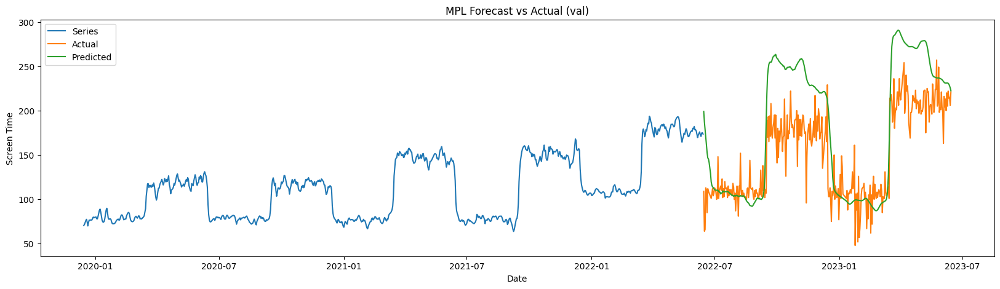

In [56]:
set_seed(42)
model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

last_window = X_val_tensor[-1].squeeze()

preds_scaled = forecast_iterative(model, last_window, len(val))
MLP_val_preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()

MLP_rmse_val = np.sqrt(mean_squared_error(val.screen_time.values, MLP_val_preds_orig))
print(f'{MLP_rmse_val:.2f}')
plot_results(train_clean, val.index, val['screen_time'].values, MLP_val_preds_orig, 'MPL Forecast vs Actual (val)')

ORIGINAL-MLP 87.97


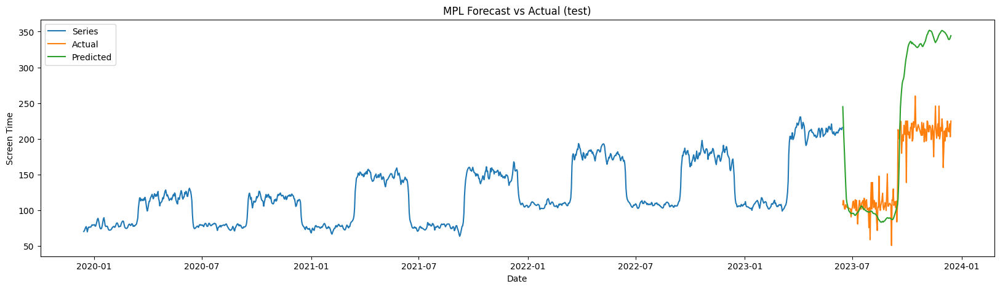

In [57]:
set_seed(42)
train_scaled = scaler.fit_transform(train_complete_clean['screen_time'].values.reshape(-1,1)).ravel()
test_scaled = scaler.transform(test['screen_time'].values.reshape(-1,1)).ravel()

X_train, y_train = create_dataset(train_scaled, m)
X_test, y_test = create_dataset(test_scaled, m)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

set_seed(42)
model = MLP(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.MSELoss()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

train_mlp_model(model, train_loader, optimizer, loss_fn, epochs)

last_window = X_val_tensor[-1].squeeze()

preds_scaled = forecast_iterative(model, last_window, len(test))
MLP_test_preds_orig = scaler.inverse_transform(preds_scaled.reshape(-1,1)).flatten()

MLP_rmse_test = np.sqrt(mean_squared_error(test.screen_time.values, MLP_test_preds_orig))
print(f'ORIGINAL-MLP {MLP_rmse_test:.2f}')

plot_results(train_complete_clean, test.index, test['screen_time'].values, MLP_test_preds_orig, 'MPL Forecast vs Actual (test)')

## Regression Trees

In [58]:
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.utils import check_random_state

def rolling_forecast(model, x_train, steps, look_back):
    xinput = x_train[-1]
    yfore = []
    for _ in range(steps):
        yfore.append(model.predict(xinput.reshape(1, look_back))[0])
        xinput = np.roll(xinput, -1)
        xinput[-1] = yfore[-1]
    return yfore

## XGBoost Model

In [59]:
def train_xgb_model(model, X_train, y_train):
    model.fit(
        X_train, y_train,
        verbose=False
    )
    return model

def grid_search_xgb(train, val, look_back):
    best_rmse = float('inf')
    best_model = None
    best_params = None

    look_back_list = [look_back * i for i in range(1, 5)]
    n_estimators_list  = [50, 100, 120, 140, 160, 180, 200]
    max_depth_list     = [1, 2, 3, 5, 7]
    learning_rates     = [0.001, 0.01, 0.05, 0.1]

    for look_back, n_estimators, max_depth, lr in itertools.product(
        look_back_list, n_estimators_list, max_depth_list, learning_rates):
        set_seed(42)
        
        x_train, y_train = create_dataset(train.screen_time.values, look_back)

        model = XGBRegressor(objective='reg:squarederror', n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr, verbosity=0)

        train_xgb_model(model, x_train, y_train)
        forecast = rolling_forecast(model, x_train, len(val), look_back)

        rmse = np.sqrt(mean_squared_error(val.screen_time.values, forecast))

        print(f"look_back={look_back}, n_est={n_estimators}, depth={max_depth}, lr={lr:.2f} RMSE={rmse:.3f}")

        if rmse < best_rmse:
            best_rmse   = rmse
            best_params = (look_back, n_estimators, max_depth, lr)
            best_model  = model

    print(f"\nBest RMSE: {best_rmse:.2f} with Params: {best_params}")
    return best_model, best_params, best_rmse


## Random Forest Regressor Model

In [60]:
def train_rfr_model(model, X_train, y_train):
    model.fit(
        X_train, y_train
    )
    return model

def grid_search_rfr(train, val, look_back):
    best_rmse = float('inf')
    best_model = None
    best_params = None

    look_back_list    = [look_back, look_back*2]
    n_estimators_list = [50, 100]
    max_depth_list    = [None, 5]
    min_samples_split = [2, 5]
    min_samples_leaf  = [1, 2,]
    max_features_list = [None, 'sqrt']

    for (lb, n_est, depth, mss, msl, mf) in itertools.product(
        look_back_list,
        n_estimators_list,
        max_depth_list,
        min_samples_split,
        min_samples_leaf,
        max_features_list
    ):
        set_seed(42)
        
        rs = check_random_state(42)

        X_train, y_train = create_dataset(train.screen_time.values, lb)

        model = RandomForestRegressor(
            n_estimators=n_est,
            max_depth=depth,
            min_samples_split=mss,
            min_samples_leaf=msl,
            max_features=mf,
            random_state=rs
        )

        train_rfr_model(model, X_train, y_train)

        forecast = rolling_forecast(model, X_train, len(val), lb)

        rmse = np.sqrt(mean_squared_error(val.screen_time.values, forecast))

        print(f"lb={lb} n_est={n_est} depth={depth} mss={mss} msl={msl} mf={mf} RMSE={rmse:.3f}")

        if rmse < best_rmse:
            best_rmse   = rmse
            best_params = (lb, n_est, depth, mss, msl, mf)
            best_model  = model

    print(f"\nBest RMSE: {best_rmse:.3f} with params: {best_params}")
    return best_model, best_params, best_rmse

## Monthly

### XGBoost

In [61]:
# best_model, best_params, best_rmse = grid_search_xgb(train_monthly_clean, val_monthly, m_monthly)
# Best RMSE: 28.30 with Params: (24, 200, 1, 0.1)


look_back, n_estimators, max_depth, lr = (24, 200, 1, 0.1)

gxboost_rmse_val: 28.30


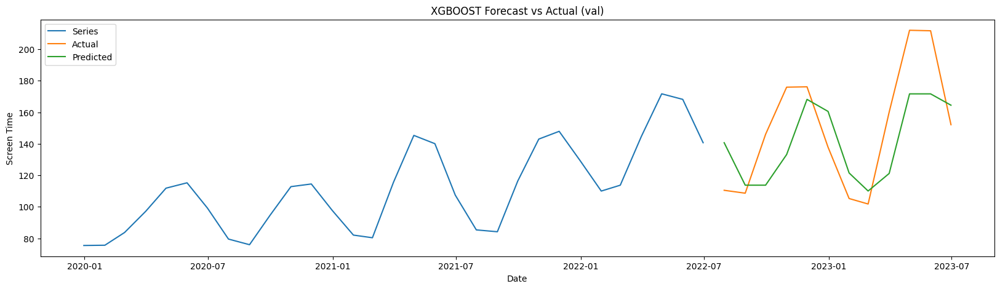

In [62]:
set_seed(42)
        
x_train, y_train = create_dataset(train_monthly_clean.screen_time.values, look_back)

model = XGBRegressor(objective='reg:squarederror', n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr, verbosity=0)

train_xgb_model(model, x_train, y_train)
gxboost_val_fore = rolling_forecast(model, x_train, len(val_monthly), look_back)


gxboost_rmse_val = np.sqrt(mean_squared_error(val_monthly.screen_time.values, gxboost_val_fore))

print(f'gxboost_rmse_val: {gxboost_rmse_val:.2f}')
plot_results(train_monthly_clean, val_monthly.index, val_monthly['screen_time'].values, gxboost_val_fore, 'XGBOOST Forecast vs Actual (val)')

MONTHLY-XGBOOST: 35.40


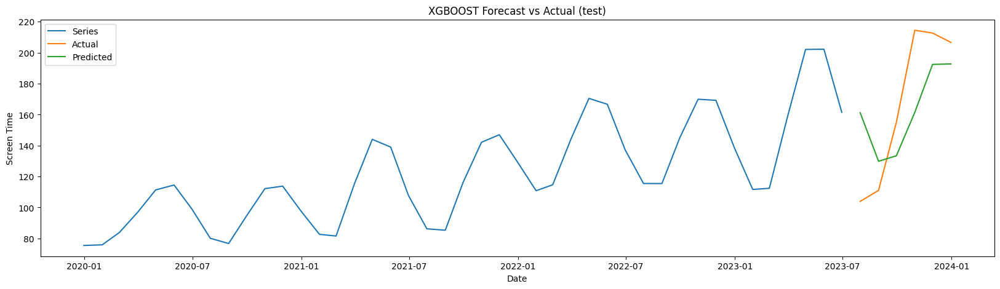

In [63]:
set_seed(42)
        
x_train, y_train = create_dataset(train_complete_monthly_clean.screen_time.values, look_back)

model = XGBRegressor(objective='reg:squarederror', n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr, verbosity=0)

train_xgb_model(model, x_train, y_train)
gxboost_test_fore = rolling_forecast(model, x_train, len(test_monthly), look_back)


gxboost_rmse_test = np.sqrt(mean_squared_error(test_monthly.screen_time.values, gxboost_test_fore))
print(f'MONTHLY-XGBOOST: {gxboost_rmse_test:.2f}')

plot_results(train_complete_monthly_clean, test_monthly.index, test_monthly['screen_time'].values, gxboost_test_fore, 'XGBOOST Forecast vs Actual (test)')



### Random Forest Regressor

In [64]:
# best_model, best_params, best_rmse = grid_search_rfr(train_monthly_clean, val_monthly, m_monthly)
# Best RMSE: 31.466 with params: (12, 50, None, 2, 1, None)


look_back, n_estimators, max_depth, min_samples_split, min_samples_leaf, max_features = (12, 50, None, 2, 1, None)

31.47


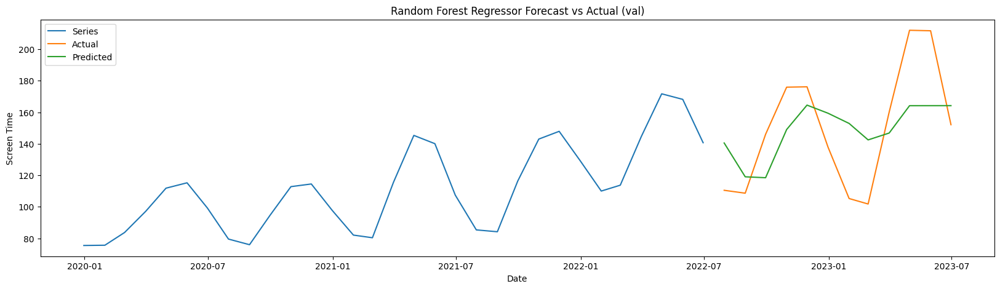

In [65]:
set_seed(42)
rs = check_random_state(42)
        
x_train, y_train = create_dataset(train_monthly_clean.screen_time.values, look_back)

model = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=rs
        )

train_rfr_model(model, x_train, y_train)
rfr_val_fore = rolling_forecast(model, x_train, len(val_monthly), look_back)


rfr_rmse_val = np.sqrt(mean_squared_error(val_monthly.screen_time.values, rfr_val_fore))

print(f'{rfr_rmse_val:.2f}')
plot_results(train_monthly_clean, val_monthly.index, val_monthly['screen_time'].values, rfr_val_fore, 'Random Forest Regressor Forecast vs Actual (val)')


MONTHLY-RANDOM-FOREST-REGRESSOR: 35.62


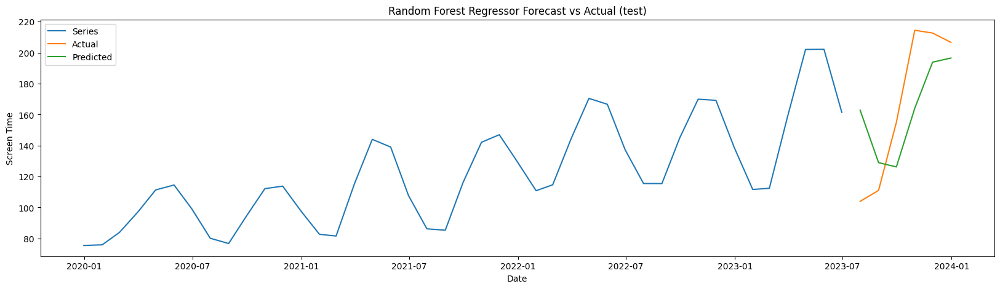

In [66]:
set_seed(42)
rs = check_random_state(42)
        
x_train, y_train = create_dataset(train_complete_monthly_clean.screen_time.values, look_back)

model = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=rs
        )

train_rfr_model(model, x_train, y_train)
rfr_test_fore = rolling_forecast(model, x_train, len(test_monthly), look_back)


rfr_rmse_test = np.sqrt(mean_squared_error(test_monthly.screen_time.values, rfr_test_fore))
print(f'MONTHLY-RANDOM-FOREST-REGRESSOR: {rfr_rmse_test:.2f}')

plot_results(train_complete_monthly_clean, test_monthly.index, test_monthly['screen_time'].values, rfr_test_fore, 'Random Forest Regressor Forecast vs Actual (test)')


### Comparison between XGBoost and Random Forest Regressor

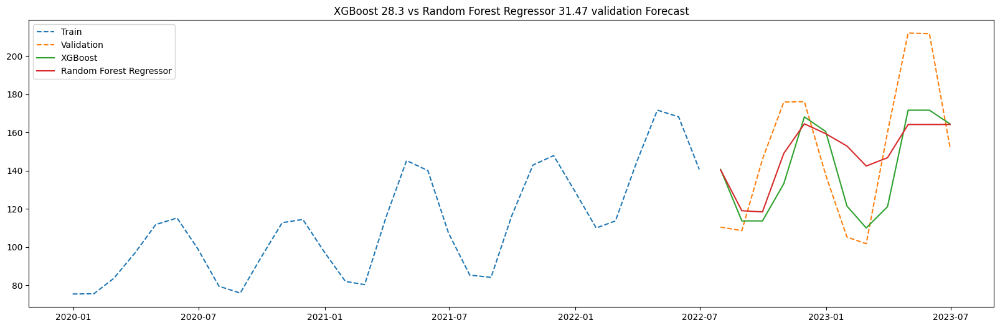

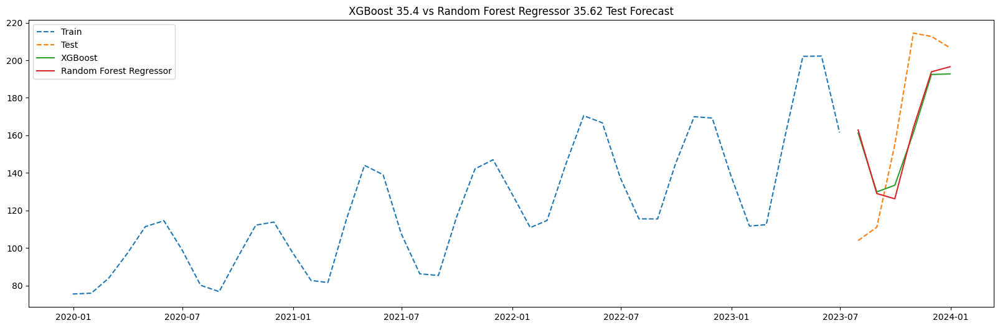

In [67]:
plt.figure(figsize=(20, 6))
plt.plot(train_monthly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(val_monthly.screen_time, label='Validation', linestyle = '--')
plt.plot(val_monthly.index, gxboost_val_fore, label='XGBoost')
plt.plot(val_monthly.index, rfr_val_fore, label='Random Forest Regressor')
plt.legend()
plt.title(f'XGBoost {gxboost_rmse_val:.4} vs Random Forest Regressor {rfr_rmse_val:.4} validation Forecast')
plt.show()

plt.figure(figsize=(20, 6))
plt.plot(train_complete_monthly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(test_monthly.screen_time, label='Test', linestyle = '--')
plt.plot(test_monthly.index, gxboost_test_fore, label='XGBoost')
plt.plot(test_monthly.index, rfr_test_fore, label='Random Forest Regressor')
plt.legend()
plt.title(f'XGBoost {gxboost_rmse_test:.4} vs Random Forest Regressor {rfr_rmse_test:.4} Test Forecast')
plt.show()

## WEEKLY

### XGBoost

In [68]:
# best_model, best_params, best_rmse = grid_search_xgb(train_weekly_clean, val_weekly, m_weekly)
# Best RMSE: 22.46 with Params: (104, 200, 3, 0.1)

look_back, n_estimators, max_depth, lr = (104, 200, 3, 0.1)

gxboost_rmse_val: 22.46


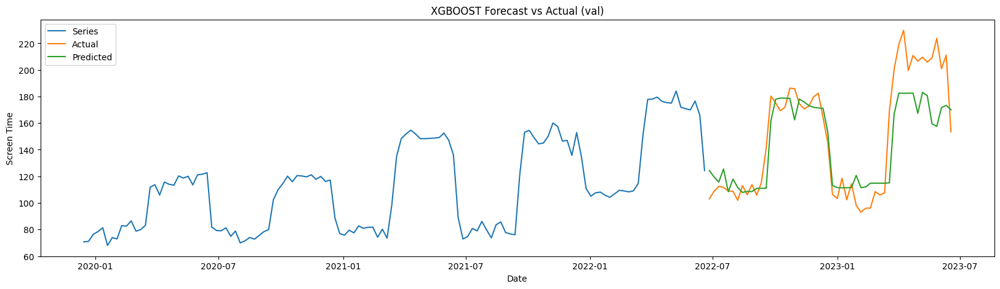

In [69]:
set_seed(42)
        
x_train, y_train = create_dataset(train_weekly_clean.screen_time.values, look_back)

model = XGBRegressor(objective='reg:squarederror', n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr, verbosity=0)

train_xgb_model(model, x_train, y_train)
gxboost_val_fore = rolling_forecast(model, x_train, len(val_weekly), look_back)


gxboost_rmse_val = np.sqrt(mean_squared_error(val_weekly.screen_time.values, gxboost_val_fore))

print(f'gxboost_rmse_val: {gxboost_rmse_val:.2f}')
plot_results(train_weekly_clean, val_weekly.index, val_weekly['screen_time'].values, gxboost_val_fore, 'XGBOOST Forecast vs Actual (val)')

WEEKLY-XGBOOST: 25.03


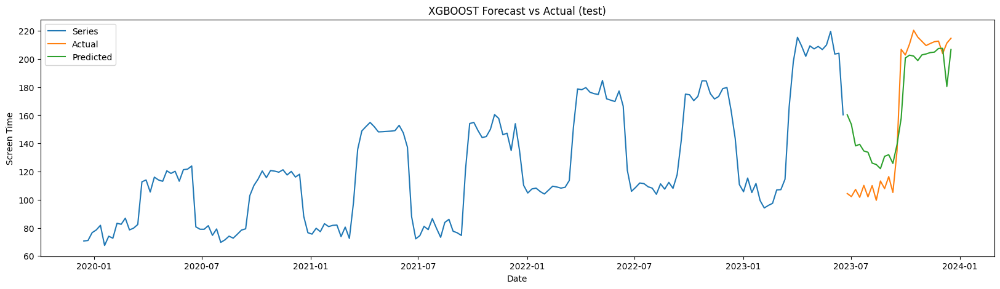

In [70]:
set_seed(42)
        
x_train, y_train = create_dataset(train_complete_weekly_clean.screen_time.values, look_back)

model = XGBRegressor(objective='reg:squarederror', n_estimators=n_estimators, max_depth=max_depth, learning_rate=lr, verbosity=0)

train_xgb_model(model, x_train, y_train)
gxboost_test_fore = rolling_forecast(model, x_train, len(test_weekly), look_back)


gxboost_rmse_test = np.sqrt(mean_squared_error(test_weekly.screen_time.values, gxboost_test_fore))

print(f'WEEKLY-XGBOOST: {gxboost_rmse_test:.2f}')

plot_results(train_complete_weekly_clean, test_weekly.index, test_weekly['screen_time'].values, gxboost_test_fore, 'XGBOOST Forecast vs Actual (test)')

### Random Forest Regressor

In [71]:
# best_model, best_params, best_rmse = grid_search_rfr(train_weekly_clean, val_weekly, m_weekly)
# Best RMSE: 26.351 with params: (52, 100, 5, 2, 1, None)

look_back, n_estimators, max_depth, min_samples_split, min_samples_leaf, max_features = (52, 100, 5, 2, 1, None)

26.35


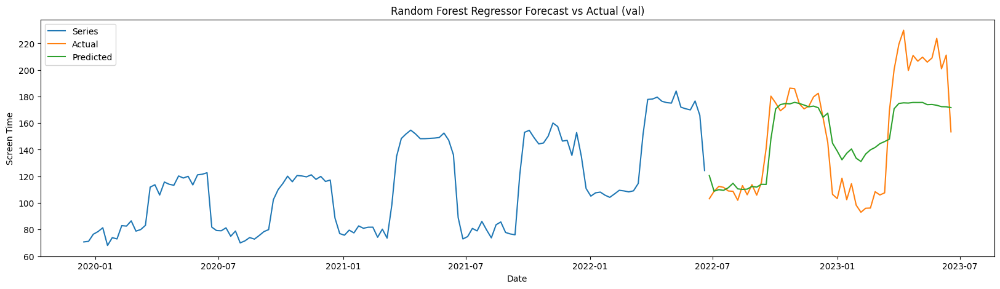

In [72]:
set_seed(42)
rs = check_random_state(42)
        
x_train, y_train = create_dataset(train_weekly_clean.screen_time.values, look_back)

model = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=rs
        )

train_rfr_model(model, x_train, y_train)
rfr_val_fore = rolling_forecast(model, x_train, len(val_weekly), look_back)


rfr_rmse_val = np.sqrt(mean_squared_error(val_weekly.screen_time.values, rfr_val_fore))

print(f'{rfr_rmse_val:.2f}')
plot_results(train_weekly_clean, val_weekly.index, val_weekly['screen_time'].values, rfr_val_fore, 'Random Forest Regressor Forecast vs Actual (val)')

WEEKLY-RANDOM-FOREST-REGRESSOR: 15.37


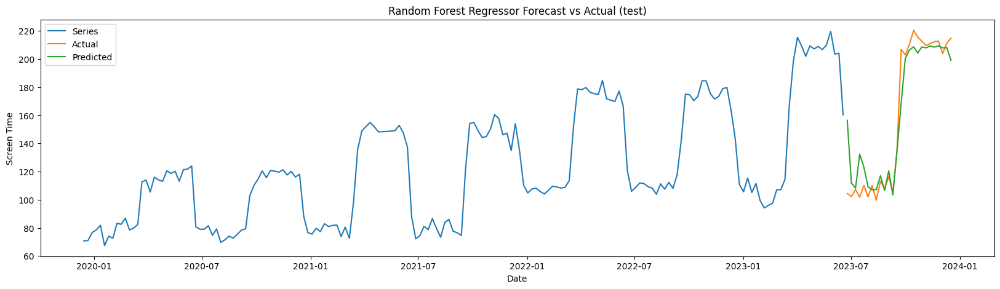

In [73]:
set_seed(42)
rs = check_random_state(42)
        
x_train, y_train = create_dataset(train_complete_weekly_clean.screen_time.values, look_back)

model = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=rs
        )

train_rfr_model(model, x_train, y_train)
rfr_test_fore = rolling_forecast(model, x_train, len(test_weekly), look_back)


rfr_rmse_test = np.sqrt(mean_squared_error(test_weekly.screen_time.values, rfr_test_fore))

print(f'WEEKLY-RANDOM-FOREST-REGRESSOR: {rfr_rmse_test:.2f}')


plot_results(train_complete_weekly_clean, test_weekly.index, test_weekly['screen_time'].values, rfr_test_fore, 'Random Forest Regressor Forecast vs Actual (test)')

### Comparison between XGBoost and Random Forest Regressor

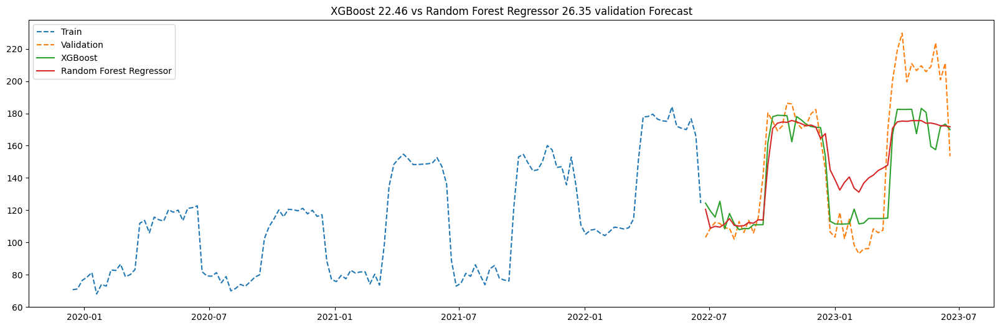

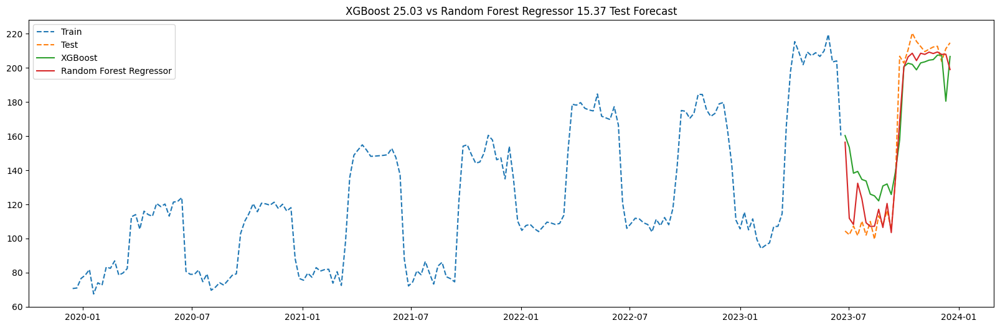

In [74]:
plt.figure(figsize=(20, 6))
plt.plot(train_weekly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(val_weekly.screen_time, label='Validation', linestyle = '--')
plt.plot(val_weekly.index, gxboost_val_fore, label='XGBoost')
plt.plot(val_weekly.index, rfr_val_fore, label='Random Forest Regressor')
plt.legend()
plt.title(f'XGBoost {gxboost_rmse_val:.4} vs Random Forest Regressor {rfr_rmse_val:.4} validation Forecast')
plt.show()

plt.figure(figsize=(20, 6))
plt.plot(train_complete_weekly_clean.screen_time, label='Train', linestyle = '--')
plt.plot(test_weekly.screen_time, label='Test', linestyle = '--')
plt.plot(test_weekly.index, gxboost_test_fore, label='XGBoost')
plt.plot(test_weekly.index, rfr_test_fore, label='Random Forest Regressor')
plt.legend()
plt.title(f'XGBoost {gxboost_rmse_test:.4} vs Random Forest Regressor {rfr_rmse_test:.4} Test Forecast')
plt.show()

## Random Forest Regressor on original time series

In [75]:
# best_model, best_params, best_rmse = grid_search_rfr(train_clean, val, m)
# 37.669 with params: (364, 50, None, 2, 1, 'sqrt')

look_back, n_estimators, max_depth, min_samples_split, min_samples_leaf, max_features = (364, 50, None, 2, 1, 'sqrt')

37.67


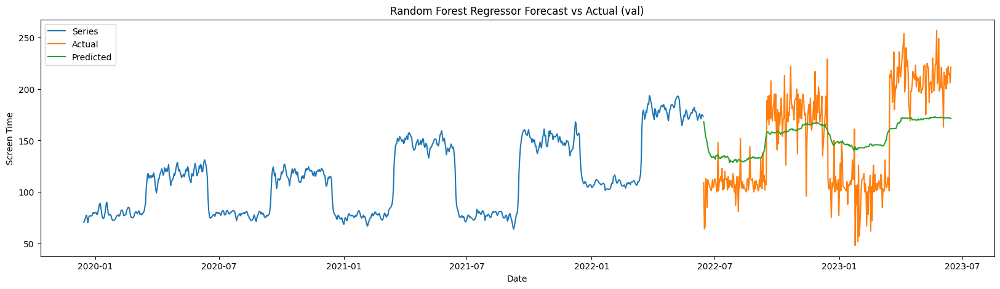

In [76]:
set_seed(42)
rs = check_random_state(42)
        
x_train, y_train = create_dataset(train_clean.screen_time.values, look_back)

model = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=rs
        )

train_rfr_model(model, x_train, y_train)
rfr_val_fore = rolling_forecast(model, x_train, len(val), look_back)


rfr_rmse_val = np.sqrt(mean_squared_error(val.screen_time.values, rfr_val_fore))

print(f'{rfr_rmse_val:.2f}')
plot_results(train_clean, val.index, val['screen_time'].values, rfr_val_fore, 'Random Forest Regressor Forecast vs Actual (val)')

ORIGINAL-RANDOM-FOREST-REGRESSOR: 24.27


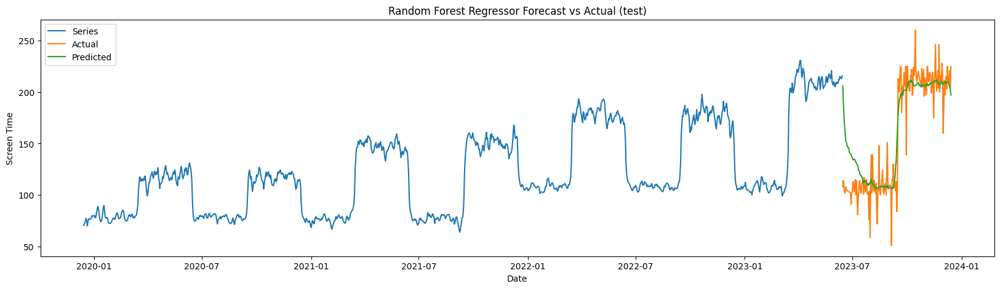

In [77]:
set_seed(42)
rs = check_random_state(42)
        
x_train, y_train = create_dataset(train_complete_clean.screen_time.values, look_back)

model = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=rs
        )

train_rfr_model(model, x_train, y_train)
rfr_test_fore = rolling_forecast(model, x_train, len(test), look_back)


rfr_rmse_test = np.sqrt(mean_squared_error(test.screen_time.values, rfr_test_fore))

print(f'ORIGINAL-RANDOM-FOREST-REGRESSOR: {rfr_rmse_test:.2f}')

plot_results(train_complete_clean, test.index, test['screen_time'].values, rfr_test_fore, 'Random Forest Regressor Forecast vs Actual (test)')